In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import numpy as np 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

In [2]:
df = pd.read_csv("temperature.csv")

In [3]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [5]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [6]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [7]:
df.shape

(7752, 25)

In [8]:
df['station'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12., 13.,
       14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25., nan])

In [9]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [10]:
df['station'].value_counts()

15.0    310
21.0    310
7.0     310
23.0    310
8.0     310
3.0     310
10.0    310
16.0    310
11.0    310
2.0     310
13.0    310
12.0    310
9.0     310
24.0    310
4.0     310
25.0    310
22.0    310
17.0    310
19.0    310
20.0    310
1.0     310
5.0     310
18.0    310
6.0     310
14.0    310
Name: station, dtype: int64

In [11]:
df['Present_Tmax'].unique()

array([28.7, 31.9, 31.6, 32. , 31.4, 32.1, 31.7, 31.3, 32.5, 30.7, 32.8,
       30.9, 32.2, 32.7, 31.5, 28.3, 30.5, 30.3, 31. , 30.8, 30. , 30.6,
       30.1, 29.9, 31.8, 24.4, 27. , 28. , 27.7, 27.8, 28.8, 27.6, 26.9,
       27.5, 28.6, 26.2, 28.4, 26.7, 29. , 26.6, 27.1, 28.1, 27.9, 28.5,
       30.4, 29.1, 28.9, 29.4, 31.1, 29.5, 29.6, 24.9, 28.2, 26.1, 27.2,
       26.5, 27.4, 30.2, 32.4, 29.3, 29.8, 33.5, 29.2, 29.7, 25.9, 23.1,
       24.8, 26.3, 26.8, 25.8, 25.3, 25.1, 24.5, 25.4, 26. , 25.6, 26.4,
        nan, 27.3, 25.2, 23.3, 25.7, 25. , 25.5, 22.4, 24.6, 24.2, 24.7,
       24.3, 23.6, 24.1, 23. , 23.7, 23.8, 22.9, 24. , 22.7, 31.2, 32.6,
       32.9, 33.2, 33.6, 33.4, 33.9, 32.3, 33.1, 33. , 34. , 33.3, 34.7,
       34.3, 34.1, 33.8, 33.7, 35.2, 34.9, 34.2, 34.8, 35.5, 34.5, 34.4,
       35.1, 21.2, 23.4, 23.2, 23.9, 23.5, 35.7, 34.6, 22.5, 21.7, 22.8,
       35.9, 35.3, 20.6, 21.9, 22.2, 20.4, 22. , 35. , 36.5, 35.4, 35.6,
       21.4, 21.6, 22.1, 22.6, 37.5, 20.7, 21.5, 36

In [12]:
df['Present_Tmax'].value_counts()

31.4    112
29.4    111
29.1    108
29.7    107
30.6    105
       ... 
36.4      1
20.3      1
20.1      1
36.9      1
20.4      1
Name: Present_Tmax, Length: 167, dtype: int64

In [13]:
df['Present_Tmin'].value_counts()

24.0    161
23.8    153
23.1    144
23.5    143
23.3    142
       ... 
29.6      1
13.5      1
14.3      1
14.2      1
29.7      1
Name: Present_Tmin, Length: 155, dtype: int64

In [14]:
df['LDAPS_RHmax']

0        91.116364
1        90.604721
2        83.973587
3        96.483688
4        90.155128
           ...    
7747     78.869858
7748     77.294975
7749     77.243744
7750     58.936283
7751    100.000153
Name: LDAPS_RHmax, Length: 7752, dtype: float64

In [15]:
df['LDAPS_Tmax_lapse']

0       28.074101
1       29.850689
2       30.091292
3       29.704629
4       29.113934
          ...    
7747    26.352081
7748    27.010193
7749    27.939516
7750    17.624954
7751    38.542255
Name: LDAPS_Tmax_lapse, Length: 7752, dtype: float64

In [16]:
df['LDAPS_Tmin_lapse']

0       23.006936
1       24.035009
2       24.565633
3       23.326177
4       23.486480
          ...    
7747    18.775678
7748    18.733519
7749    18.522965
7750    14.272646
7751    29.619342
Name: LDAPS_Tmin_lapse, Length: 7752, dtype: float64

In [17]:
df['LDAPS_WS']

0        6.818887
1        5.691890
2        6.138224
3        5.650050
4        5.735004
          ...    
7747     6.148918
7748     6.542819
7749     7.289264
7750     2.882580
7751    21.857621
Name: LDAPS_WS, Length: 7752, dtype: float64

In [18]:
df['LDAPS_LH']

0        69.451805
1        51.937448
2        20.573050
3        65.727144
4       107.965535
           ...    
7747     72.058294
7748     47.241457
7749      9.090034
7750    -13.603212
7751    213.414006
Name: LDAPS_LH, Length: 7752, dtype: float64

In [19]:
df['LDAPS_CC1']

0       0.233947
1       0.225508
2       0.209344
3       0.216372
4       0.151407
          ...   
7747    0.030034
7748    0.035874
7749    0.048954
7750    0.000000
7751    0.967277
Name: LDAPS_CC1, Length: 7752, dtype: float64

In [20]:
df['LDAPS_CC2']

0       0.203896
1       0.251771
2       0.257469
3       0.226002
4       0.249995
          ...   
7747    0.081035
7748    0.074962
7749    0.059869
7750    0.000000
7751    0.968353
Name: LDAPS_CC2, Length: 7752, dtype: float64

In [21]:
df['LDAPS_CC3']

0       0.161697
1       0.159444
2       0.204091
3       0.161157
4       0.178892
          ...   
7747    0.000000
7748    0.000000
7749    0.000000
7750    0.000000
7751    0.983789
Name: LDAPS_CC3, Length: 7752, dtype: float64

In [22]:
df['LDAPS_CC4']

0       0.130928
1       0.127727
2       0.142125
3       0.134249
4       0.170021
          ...   
7747    0.000000
7748    0.000000
7749    0.000796
7750    0.000000
7751    0.974710
Name: LDAPS_CC4, Length: 7752, dtype: float64

In [23]:
df['LDAPS_PPT1']

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
          ...    
7747     0.000000
7748     0.000000
7749     0.000000
7750     0.000000
7751    23.701544
Name: LDAPS_PPT1, Length: 7752, dtype: float64

In [24]:
df['LDAPS_PPT2']

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
          ...    
7747     0.000000
7748     0.000000
7749     0.000000
7750     0.000000
7751    21.621661
Name: LDAPS_PPT2, Length: 7752, dtype: float64

<AxesSubplot:>

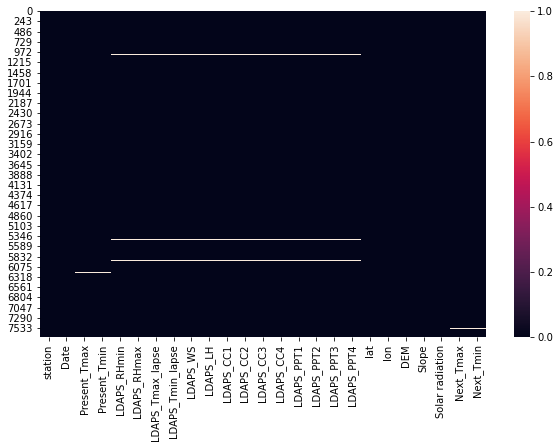

In [25]:
plt.figure(figsize=(10,6))
sns.heatmap(df.isnull())

In [26]:
mode_value=df['station'].mode()[0]

In [27]:
df['station'].fillna(mode_value,inplace=True)

In [28]:
mode_value=df["Date"].mode()[0]

In [29]:
df["Date"].fillna(mode_value,inplace=True)

In [30]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

<AxesSubplot:xlabel='Present_Tmax', ylabel='Density'>

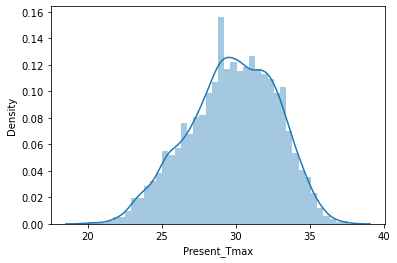

In [31]:
sns.distplot(df['Present_Tmax'])

In [32]:
df['Present_Tmax'].skew()

-0.26294236931533904

In [33]:
mean_value=df["Present_Tmax"].mean()

In [34]:
df["Present_Tmax"].fillna(mean_value,inplace=True)

In [35]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [36]:
df['Present_Tmin']

0       21.4
1       21.6
2       23.3
3       23.4
4       21.9
        ... 
7747    17.1
7748    17.7
7749    17.4
7750    11.3
7751    29.9
Name: Present_Tmin, Length: 7752, dtype: float64

<AxesSubplot:xlabel='Present_Tmin', ylabel='Density'>

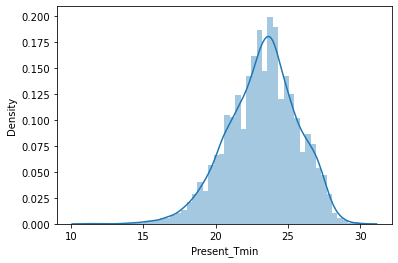

In [37]:
sns.distplot(df['Present_Tmin'])

In [38]:
df['Present_Tmin'].skew()

-0.36587518142174663

In [39]:
mean_value=df["Present_Tmin"].mean()

In [40]:
df["Present_Tmin"].fillna(mean_value,inplace=True)

In [41]:
df["LDAPS_RHmin"]

0       58.255688
1       52.263397
2       48.690479
3       58.239788
4       56.174095
          ...    
7747    26.741310
7748    24.040634
7749    22.933014
7750    19.794666
7751    98.524734
Name: LDAPS_RHmin, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Density'>

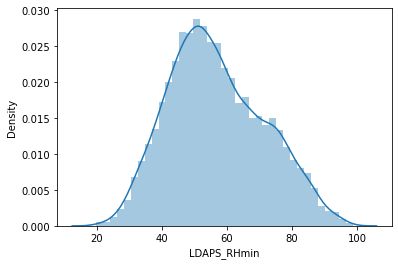

In [42]:
sns.distplot(df["LDAPS_RHmin"])

In [43]:
df["LDAPS_RHmin"].skew()

0.29876450350512485

In [44]:
meanvalue= df["LDAPS_RHmin"].mean()

In [45]:
df["LDAPS_RHmin"].fillna(mean_value,inplace=True)

In [46]:
df["LDAPS_RHmax"]

0        91.116364
1        90.604721
2        83.973587
3        96.483688
4        90.155128
           ...    
7747     78.869858
7748     77.294975
7749     77.243744
7750     58.936283
7751    100.000153
Name: LDAPS_RHmax, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Density'>

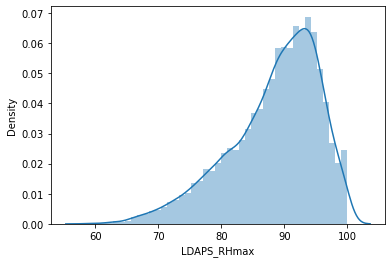

In [47]:
sns.distplot(df["LDAPS_RHmax"])

In [48]:
df["LDAPS_RHmax"].skew()

-0.850869965625848

In [49]:
median_value=df["LDAPS_RHmax"].median()

In [50]:
df["LDAPS_RHmax"].fillna(median_value,inplace = True)

In [51]:
df["LDAPS_Tmax_lapse"]

0       28.074101
1       29.850689
2       30.091292
3       29.704629
4       29.113934
          ...    
7747    26.352081
7748    27.010193
7749    27.939516
7750    17.624954
7751    38.542255
Name: LDAPS_Tmax_lapse, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Density'>

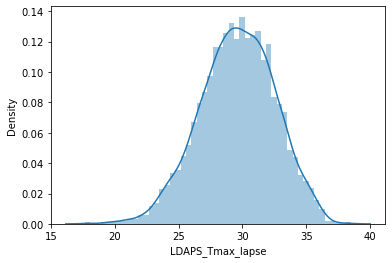

In [52]:
sns.distplot(df["LDAPS_Tmax_lapse"])

In [53]:
df["LDAPS_Tmax_lapse"].skew()

-0.22677491716332973

In [54]:
mean_value=df["LDAPS_Tmax_lapse"].mean()

In [55]:
df["LDAPS_Tmax_lapse"].fillna(mean_value,inplace=True)

In [56]:
df["LDAPS_Tmin_lapse"]

0       23.006936
1       24.035009
2       24.565633
3       23.326177
4       23.486480
          ...    
7747    18.775678
7748    18.733519
7749    18.522965
7750    14.272646
7751    29.619342
Name: LDAPS_Tmin_lapse, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Density'>

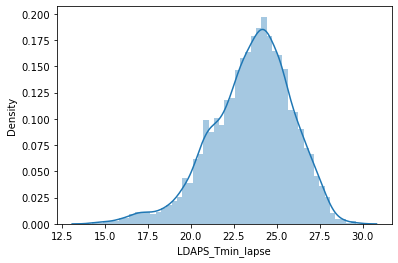

In [57]:
sns.distplot(df["LDAPS_Tmin_lapse"])

In [58]:
df["LDAPS_Tmin_lapse"].skew()

-0.5789432589774393

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Density'>

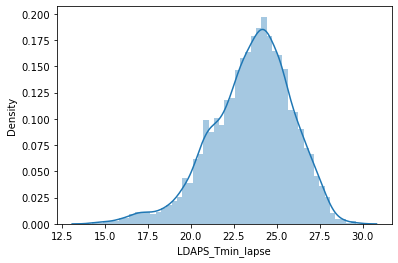

In [59]:
sns.distplot(df["LDAPS_Tmin_lapse"])

In [60]:
df["LDAPS_Tmin_lapse"].skew()

-0.5789432589774393

In [61]:
median_value=df["LDAPS_Tmin_lapse"].median()

In [62]:
df["LDAPS_Tmin_lapse"].fillna(median_value,inplace=True)

In [63]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [64]:
df["LDAPS_WS"]

0        6.818887
1        5.691890
2        6.138224
3        5.650050
4        5.735004
          ...    
7747     6.148918
7748     6.542819
7749     7.289264
7750     2.882580
7751    21.857621
Name: LDAPS_WS, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Density'>

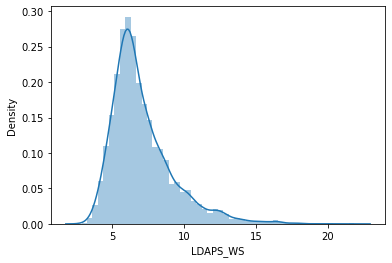

In [65]:
sns.distplot(df["LDAPS_WS"])

In [66]:
df["LDAPS_WS"].skew()

1.5715808833893343

In [67]:
median_value=df["LDAPS_WS"].median()

In [68]:
median_value

6.547470301

In [69]:
df["LDAPS_WS"].fillna(median_value,inplace=True)

In [70]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [71]:
df["LDAPS_LH"]

0        69.451805
1        51.937448
2        20.573050
3        65.727144
4       107.965535
           ...    
7747     72.058294
7748     47.241457
7749      9.090034
7750    -13.603212
7751    213.414006
Name: LDAPS_LH, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Density'>

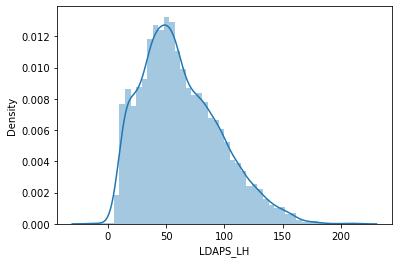

In [72]:
sns.distplot(df["LDAPS_LH"])

In [73]:
df["LDAPS_LH"].skew()

0.6704914370944346

In [74]:
median_va = df["LDAPS_LH"].median()

In [75]:
df["LDAPS_LH"].fillna(median_va, inplace=True)

In [76]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [77]:
df["LDAPS_CC1"]

0       0.233947
1       0.225508
2       0.209344
3       0.216372
4       0.151407
          ...   
7747    0.030034
7748    0.035874
7749    0.048954
7750    0.000000
7751    0.967277
Name: LDAPS_CC1, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Density'>

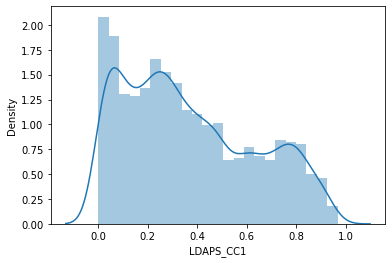

In [78]:
sns.distplot(df["LDAPS_CC1"])

In [79]:
df["LDAPS_CC1"].skew()

0.4572306411668014

In [80]:
median_val=df["LDAPS_CC1"].median()

In [81]:
df["LDAPS_CC1"].fillna(median_val, inplace=True)

In [82]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [83]:
df["LDAPS_CC2"]

0       0.203896
1       0.251771
2       0.257469
3       0.226002
4       0.249995
          ...   
7747    0.081035
7748    0.074962
7749    0.059869
7750    0.000000
7751    0.968353
Name: LDAPS_CC2, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Density'>

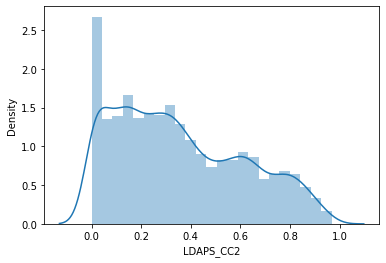

In [84]:
sns.distplot(df["LDAPS_CC2"])

In [85]:
df["LDAPS_CC2"].skew()

0.47006020652045327

In [86]:
median_value=df["LDAPS_CC2"].median()

In [87]:
df["LDAPS_CC2"].fillna(median_value, inplace = True)

In [88]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [89]:
df["LDAPS_CC3"]

0       0.161697
1       0.159444
2       0.204091
3       0.161157
4       0.178892
          ...   
7747    0.000000
7748    0.000000
7749    0.000000
7750    0.000000
7751    0.983789
Name: LDAPS_CC3, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Density'>

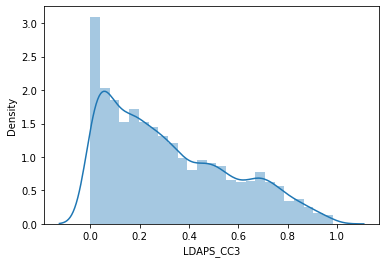

In [90]:
sns.distplot(df["LDAPS_CC3"])

In [91]:
df["LDAPS_CC3"].skew()

0.6376295817282918

In [92]:
m_value= df["LDAPS_CC3"].median()

In [93]:
df["LDAPS_CC3"].fillna(m_value,inplace = True)

In [94]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [95]:
df["LDAPS_CC4"]

0       0.130928
1       0.127727
2       0.142125
3       0.134249
4       0.170021
          ...   
7747    0.000000
7748    0.000000
7749    0.000796
7750    0.000000
7751    0.974710
Name: LDAPS_CC4, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Density'>

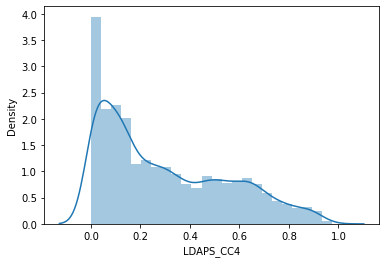

In [96]:
sns.distplot(df["LDAPS_CC4"])

In [97]:
df["LDAPS_CC4"].skew()

0.6632509819587612

In [98]:
m_value= df["LDAPS_CC4"].median()

In [99]:
df["LDAPS_CC4"].fillna(m_value, inplace= True)

In [100]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [101]:
df["LDAPS_PPT1"]

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
          ...    
7747     0.000000
7748     0.000000
7749     0.000000
7750     0.000000
7751    23.701544
Name: LDAPS_PPT1, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Density'>

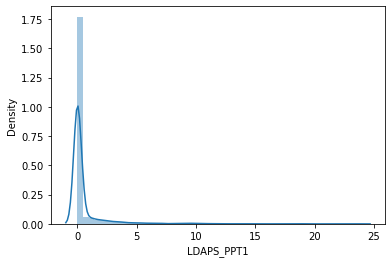

In [102]:
sns.distplot(df["LDAPS_PPT1"])

In [103]:
df['LDAPS_PPT1'].skew()

5.36767547352051

In [104]:
m_v = df["LDAPS_PPT1"].median()

In [105]:
df["LDAPS_PPT1"].fillna(m_v, inplace = True)

In [106]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1           0
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [107]:
df["LDAPS_PPT2"]

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
          ...    
7747     0.000000
7748     0.000000
7749     0.000000
7750     0.000000
7751    21.621661
Name: LDAPS_PPT2, Length: 7752, dtype: float64

In [108]:
df["LDAPS_PPT2"].skew()

5.747359561521097

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Density'>

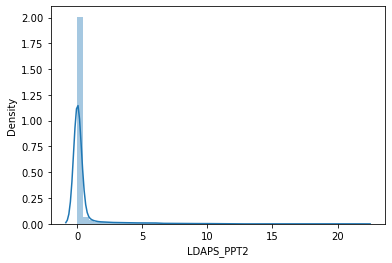

In [109]:
sns.distplot(df["LDAPS_PPT2"])

In [110]:
m_value= df["LDAPS_PPT2"].median()

In [111]:
df["LDAPS_PPT2"].fillna(m_value, inplace = True)

In [112]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1           0
LDAPS_PPT2           0
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [113]:
df["LDAPS_PPT3"]

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
          ...    
7747     0.000000
7748     0.000000
7749     0.000000
7750     0.000000
7751    15.841235
Name: LDAPS_PPT3, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Density'>

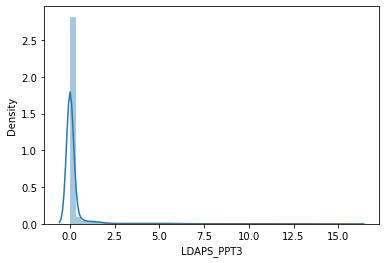

In [114]:
sns.distplot(df["LDAPS_PPT3"])

In [115]:
df["LDAPS_PPT3"].skew()

6.425829484728282

In [116]:
m_val = df["LDAPS_PPT3"].median()

In [117]:
df["LDAPS_PPT3"].fillna(m_val,inplace = True)

In [118]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1           0
LDAPS_PPT2           0
LDAPS_PPT3           0
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [119]:
df["LDAPS_PPT4"]

0        0.000000
1        0.000000
2        0.000000
3        0.000000
4        0.000000
          ...    
7747     0.000000
7748     0.000000
7749     0.000000
7750     0.000000
7751    16.655469
Name: LDAPS_PPT4, Length: 7752, dtype: float64

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Density'>

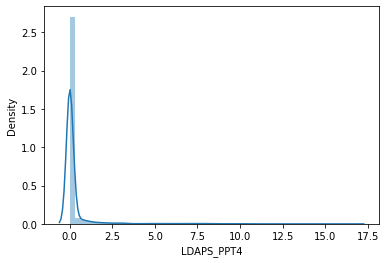

In [120]:
sns.distplot(df["LDAPS_PPT4"])

In [121]:
df["LDAPS_PPT4"].skew()

6.792379038934569

In [122]:
median_value= df["LDAPS_PPT4"].median()

In [123]:
df["LDAPS_PPT4"].fillna(median_value, inplace = True)

In [124]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1           0
LDAPS_PPT2           0
LDAPS_PPT3           0
LDAPS_PPT4           0
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [125]:
df["Next_Tmax"]

0       29.1
1       30.5
2       31.1
3       31.7
4       31.2
        ... 
7747    28.3
7748    28.6
7749    27.8
7750    17.4
7751    38.9
Name: Next_Tmax, Length: 7752, dtype: float64

<AxesSubplot:xlabel='Next_Tmax', ylabel='Density'>

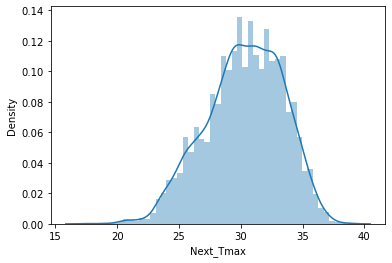

In [126]:
sns.distplot(df["Next_Tmax"])

In [127]:
df["Next_Tmax"].skew()

-0.3396071784374196

In [128]:
mean_value = df["Next_Tmax"].mean()

In [129]:
df["Next_Tmax"].fillna(mean_value, inplace = True)

In [130]:
df.isnull().sum()

station              0
Date                 0
Present_Tmax         0
Present_Tmin         0
LDAPS_RHmin          0
LDAPS_RHmax          0
LDAPS_Tmax_lapse     0
LDAPS_Tmin_lapse     0
LDAPS_WS             0
LDAPS_LH             0
LDAPS_CC1            0
LDAPS_CC2            0
LDAPS_CC3            0
LDAPS_CC4            0
LDAPS_PPT1           0
LDAPS_PPT2           0
LDAPS_PPT3           0
LDAPS_PPT4           0
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax            0
Next_Tmin           27
dtype: int64

In [131]:
df["Next_Tmin"]

0       21.2
1       22.5
2       23.9
3       24.3
4       22.5
        ... 
7747    18.1
7748    18.8
7749    17.4
7750    11.3
7751    29.8
Name: Next_Tmin, Length: 7752, dtype: float64

<AxesSubplot:xlabel='Next_Tmin', ylabel='Density'>

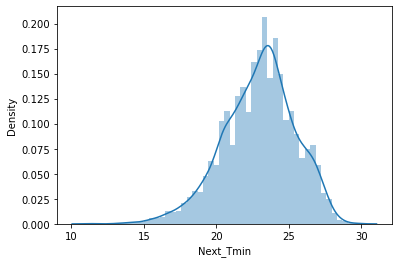

In [132]:
sns.distplot(df["Next_Tmin"])

In [133]:
df["Next_Tmin"].skew()

-0.4037428032567598

In [134]:
mean_val = df["Next_Tmin"].mean()

In [135]:
df["Next_Tmin"].fillna(mean_val, inplace = True)

In [136]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [137]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [138]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Date              7752 non-null   object 
 2   Present_Tmax      7752 non-null   float64
 3   Present_Tmin      7752 non-null   float64
 4   LDAPS_RHmin       7752 non-null   float64
 5   LDAPS_RHmax       7752 non-null   float64
 6   LDAPS_Tmax_lapse  7752 non-null   float64
 7   LDAPS_Tmin_lapse  7752 non-null   float64
 8   LDAPS_WS          7752 non-null   float64
 9   LDAPS_LH          7752 non-null   float64
 10  LDAPS_CC1         7752 non-null   float64
 11  LDAPS_CC2         7752 non-null   float64
 12  LDAPS_CC3         7752 non-null   float64
 13  LDAPS_CC4         7752 non-null   float64
 14  LDAPS_PPT1        7752 non-null   float64
 15  LDAPS_PPT2        7752 non-null   float64
 16  LDAPS_PPT3        7752 non-null   float64


In [140]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.996904,29.768211,23.225059,56.434930,88.388529,29.613447,23.514984,7.092549,62.450457,0.368260,...,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.213213,2.956557,2.403036,14.961540,7.158471,2.932898,2.334099,2.173913,33.571540,0.261236,...,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.122557,2.483276
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.735368,84.316923,27.693091,22.114651,5.686487,37.532764,0.148321,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000
50%,13.000000,29.900000,23.400000,54.828714,89.793480,29.662273,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [141]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.112756,0.132068,-0.065162,-0.166359,0.069306,0.105004,0.004231,-0.133770,0.006725,...,-0.010771,-0.015291,-0.013277,-0.237467,-0.118603,-0.256138,-0.090461,-0.018814,0.108236,0.128659
Present_Tmax,0.112756,1.000000,0.618760,-0.215518,-0.300322,0.570129,0.624216,-0.123582,0.134251,-0.313187,...,-0.101377,-0.122044,-0.101178,-0.052615,0.009020,-0.187121,-0.105809,-0.025439,0.610348,0.622741
Present_Tmin,0.132068,0.618760,1.000000,0.093196,-0.012754,0.464151,0.764227,-0.037708,-0.011276,0.081988,...,0.064829,-0.049005,-0.065647,-0.078475,-0.043461,-0.250275,-0.146339,0.053578,0.471806,0.796670
LDAPS_RHmin,-0.065162,-0.215518,0.093196,1.000000,0.560666,-0.550823,0.085013,0.292538,-0.065514,0.603106,...,0.387236,0.239880,0.169267,0.084977,-0.074380,0.099632,0.120734,0.249148,-0.453740,0.073050
LDAPS_RHmax,-0.166359,-0.300322,-0.012754,0.560666,1.000000,-0.373334,-0.113914,0.134786,0.238183,0.436097,...,0.228398,0.134087,0.117376,0.195761,0.025662,0.177134,0.219557,0.148259,-0.281341,-0.070246
LDAPS_Tmax_lapse,0.069306,0.570129,0.464151,-0.550823,-0.373334,1.000000,0.653985,-0.311900,0.048004,-0.438352,...,-0.242033,-0.188063,-0.160235,-0.042093,0.090666,-0.178895,-0.162332,0.047971,0.827189,0.586868
LDAPS_Tmin_lapse,0.105004,0.624216,0.764227,0.085013,-0.113914,0.653985,1.000000,-0.130245,-0.134906,0.010691,...,0.000588,-0.088791,-0.094855,-0.096252,-0.026700,-0.195445,-0.185839,0.159445,0.588206,0.881059
LDAPS_WS,0.004231,-0.123582,-0.037708,0.292538,0.134786,-0.311900,-0.130245,1.000000,0.007115,0.289792,...,0.192427,0.162173,0.144550,0.036646,-0.059448,0.190995,0.171577,0.122966,-0.345619,-0.098767
LDAPS_LH,-0.133770,0.134251,-0.011276,-0.065514,0.238183,0.048004,-0.134906,0.007115,1.000000,-0.146920,...,-0.077061,0.016483,0.020332,0.133203,0.025819,0.055126,0.086770,-0.046553,0.155608,-0.056906
LDAPS_CC1,0.006725,-0.313187,0.081988,0.603106,0.436097,-0.438352,0.010691,0.289792,-0.146920,1.000000,...,0.389771,0.169130,0.092119,-0.008129,-0.006842,-0.014087,-0.020747,0.219264,-0.454855,-0.012807


<AxesSubplot:>

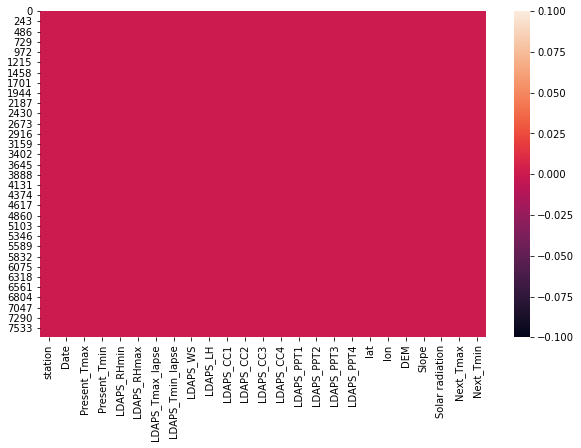

In [142]:
plt.figure(figsize=(10,6))
sns.heatmap(df.isnull())

<AxesSubplot:>

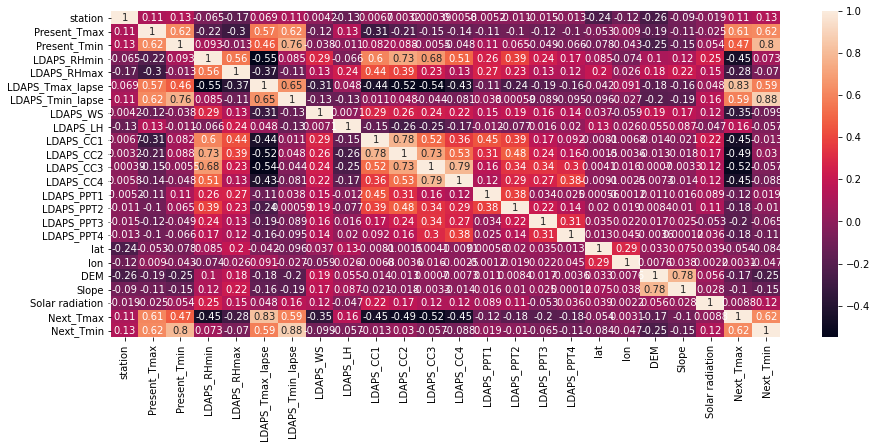

In [143]:
plt.figure(figsize=(15,6))
sns.heatmap(df.corr(),annot = True)

In [144]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


<AxesSubplot:xlabel='station', ylabel='Count'>

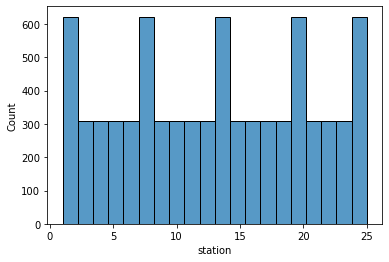

In [146]:
sns.histplot(df["station"])

<AxesSubplot:xlabel='Present_Tmax', ylabel='Count'>

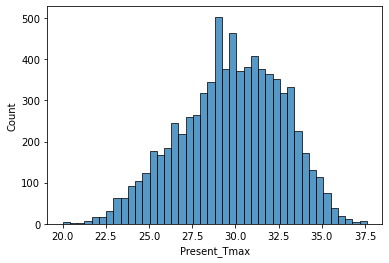

In [147]:
sns.histplot(df["Present_Tmax"])

<AxesSubplot:xlabel='Present_Tmin', ylabel='Count'>

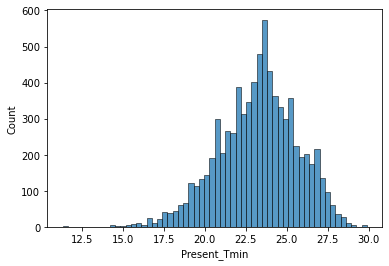

In [148]:
sns.histplot(df["Present_Tmin"])

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Count'>

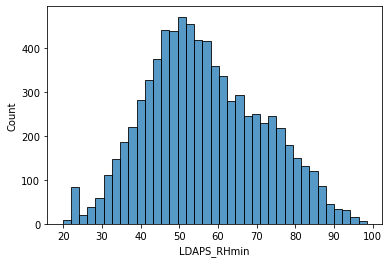

In [149]:
sns.histplot(df["LDAPS_RHmin"])

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Count'>

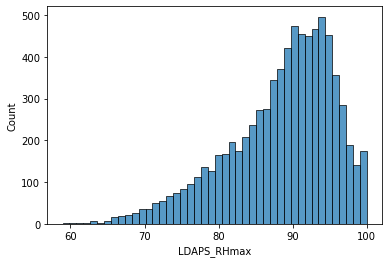

In [150]:
sns.histplot(df["LDAPS_RHmax"])

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Count'>

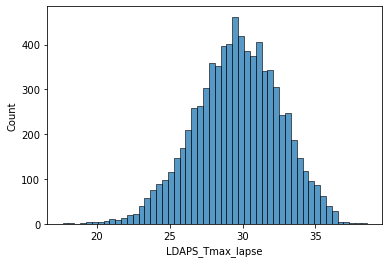

In [151]:
sns.histplot(df["LDAPS_Tmax_lapse"])

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Count'>

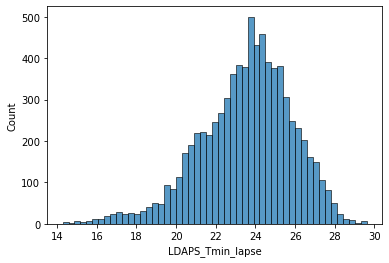

In [152]:
sns.histplot(df["LDAPS_Tmin_lapse"])

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Count'>

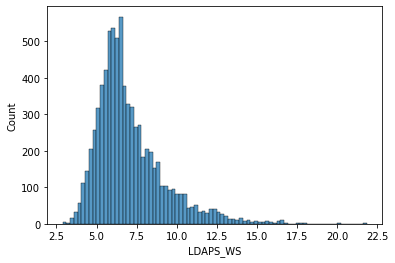

In [153]:
sns.histplot(df["LDAPS_WS"])

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Count'>

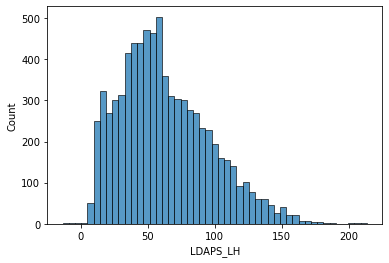

In [154]:
sns.histplot(df["LDAPS_LH"])

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Count'>

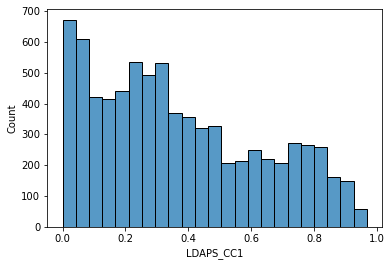

In [155]:
sns.histplot(df["LDAPS_CC1"])

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Count'>

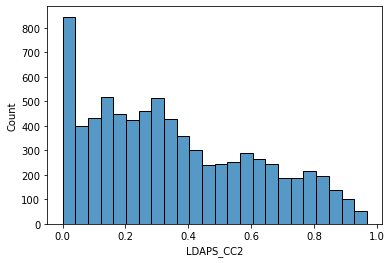

In [156]:
sns.histplot(df["LDAPS_CC2"])

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Count'>

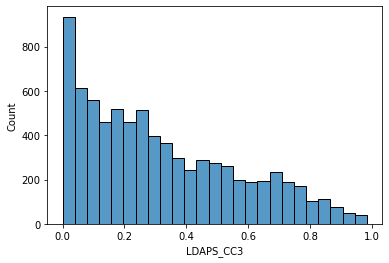

In [157]:
sns.histplot(df["LDAPS_CC3"])

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Count'>

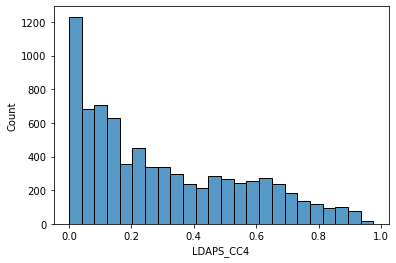

In [158]:
sns.histplot(df["LDAPS_CC4"])

<AxesSubplot:xlabel='lat', ylabel='Count'>

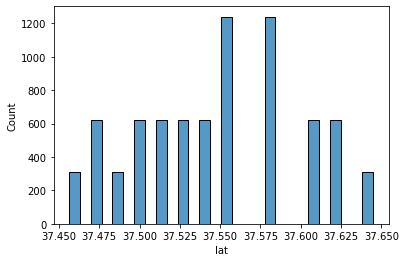

In [161]:
sns.histplot(df["lat"])

<AxesSubplot:xlabel='lon', ylabel='Count'>

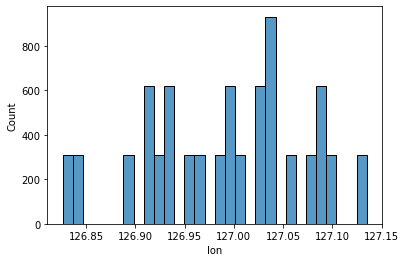

In [162]:
sns.histplot(df["lon"])

<AxesSubplot:xlabel='DEM', ylabel='Count'>

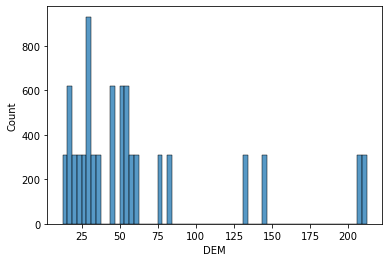

In [164]:
sns.histplot(df["DEM"])

<AxesSubplot:xlabel='Slope', ylabel='Count'>

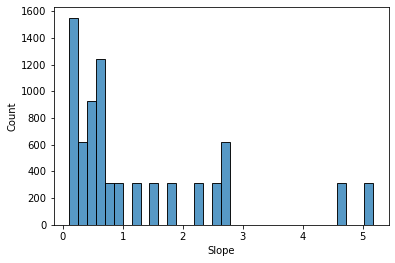

In [165]:
sns.histplot(df["Slope"])

<AxesSubplot:xlabel='Solar radiation', ylabel='Count'>

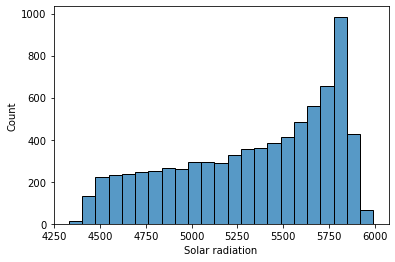

In [166]:
sns.histplot(df["Solar radiation"])

<AxesSubplot:xlabel='Next_Tmax', ylabel='Count'>

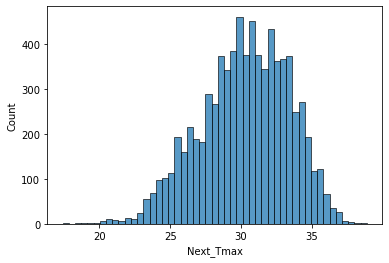

In [167]:
sns.histplot(df["Next_Tmax"])

<AxesSubplot:xlabel='Next_Tmin', ylabel='Count'>

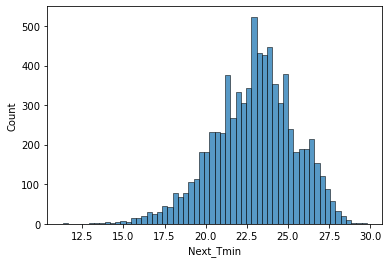

In [168]:
sns.histplot(df["Next_Tmin"])

<AxesSubplot:xlabel='station', ylabel='Next_Tmax'>

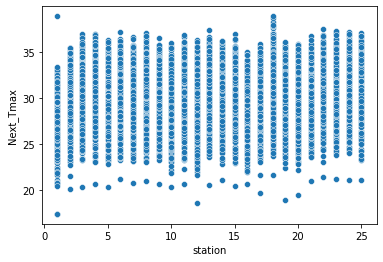

In [169]:
sns.scatterplot(x='station',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Date', ylabel='Next_Tmax'>

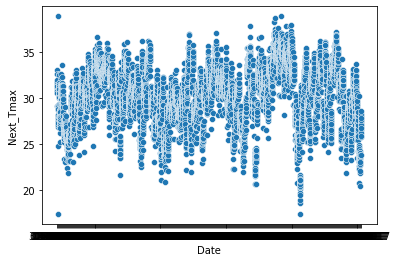

In [170]:
sns.scatterplot(x='Date',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Next_Tmax'>

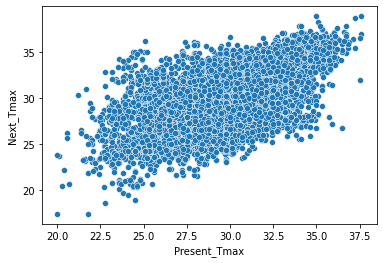

In [171]:
sns.scatterplot(x='Present_Tmax',y='Next_Tmax',data=df)

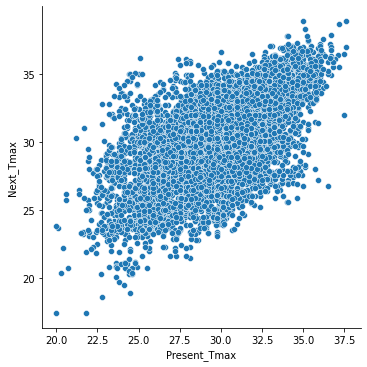

In [276]:
sns.relplot(x='Present_Tmax',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Next_Tmax'>

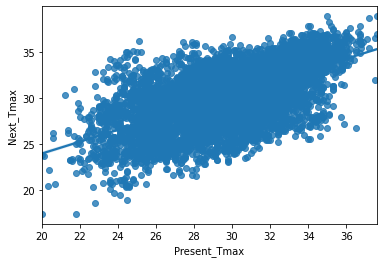

In [277]:
sns.regplot(x='Present_Tmax',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmax'>

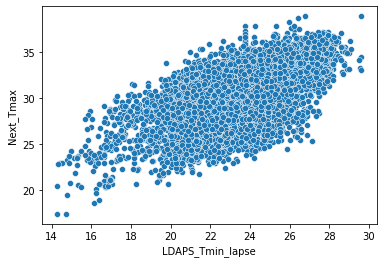

In [172]:
sns.scatterplot(x='LDAPS_Tmin_lapse',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmax'>

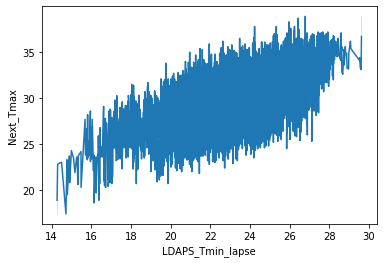

In [279]:
sns.lineplot(x='LDAPS_Tmin_lapse',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmax'>

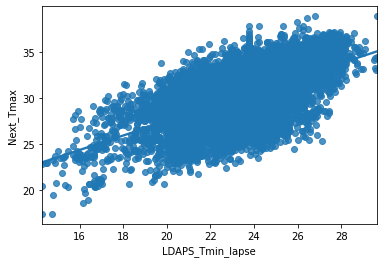

In [280]:
sns.regplot(x='LDAPS_Tmin_lapse',y='Next_Tmax',data=df)

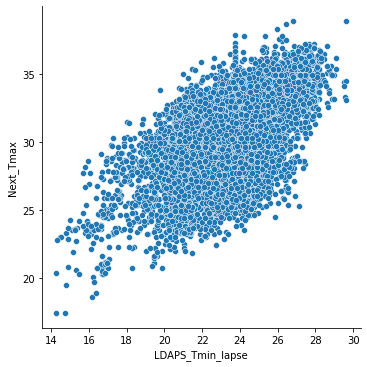

In [281]:
sns.relplot(x='LDAPS_Tmin_lapse',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmax'>

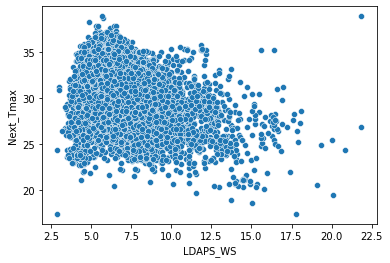

In [173]:
sns.scatterplot(x='LDAPS_WS',y='Next_Tmax',data=df) 

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmax'>

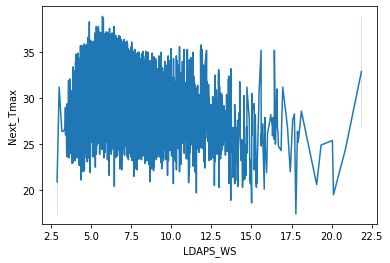

In [282]:
sns.lineplot(x='LDAPS_WS',y='Next_Tmax',data=df) 

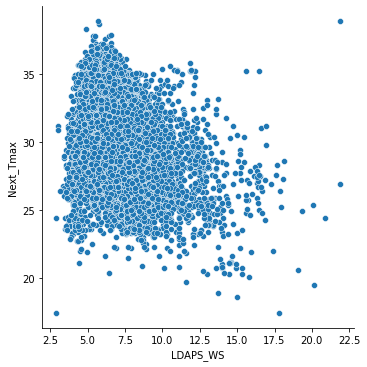

In [283]:
sns.relplot(x='LDAPS_WS',y='Next_Tmax',data=df) 

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmax'>

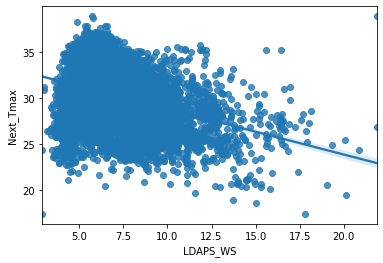

In [284]:
sns.regplot(x='LDAPS_WS',y='Next_Tmax',data=df) 

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmax'>

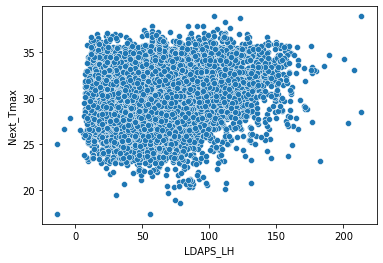

In [174]:
sns.scatterplot(x='LDAPS_LH',y='Next_Tmax',data=df)

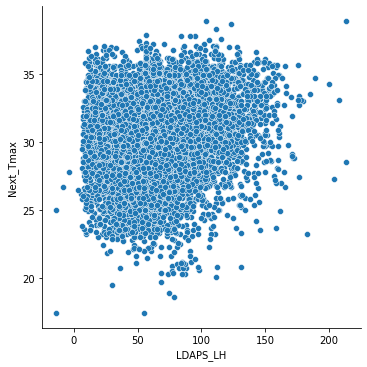

In [285]:
sns.relplot(x='LDAPS_LH',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmax'>

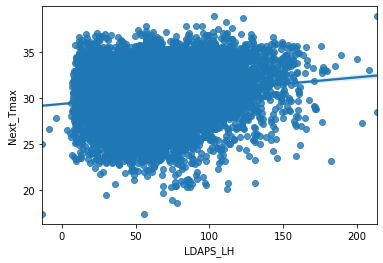

In [286]:
sns.regplot(x='LDAPS_LH',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmax'>

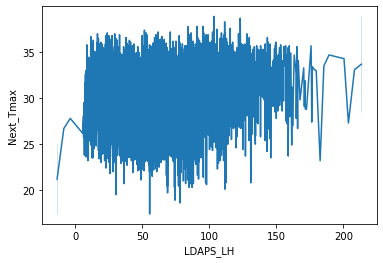

In [287]:
sns.lineplot(x='LDAPS_LH',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmax'>

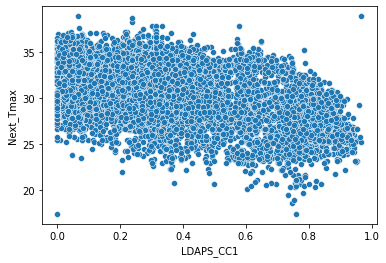

In [175]:
sns.scatterplot(x='LDAPS_CC1',y='Next_Tmax',data=df)

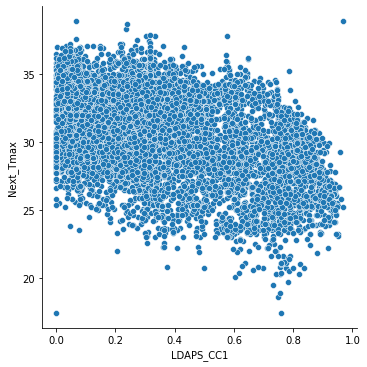

In [288]:
sns.relplot(x='LDAPS_CC1',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmax'>

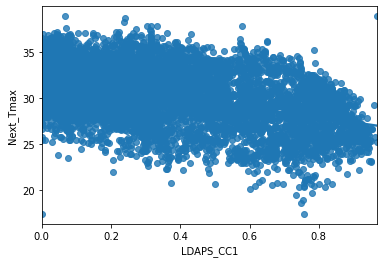

In [289]:
sns.regplot(x='LDAPS_CC1',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmax'>

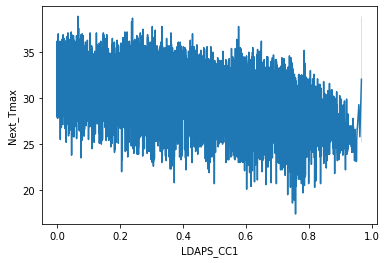

In [290]:
sns.lineplot(x='LDAPS_CC1',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmax'>

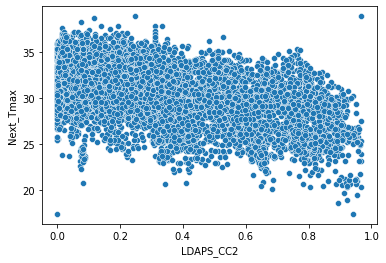

In [176]:
sns.scatterplot(x='LDAPS_CC2',y='Next_Tmax',data=df)

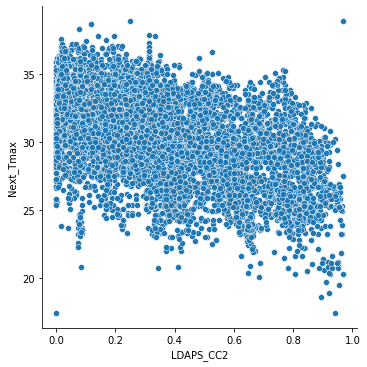

In [291]:
sns.relplot(x='LDAPS_CC2',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmax'>

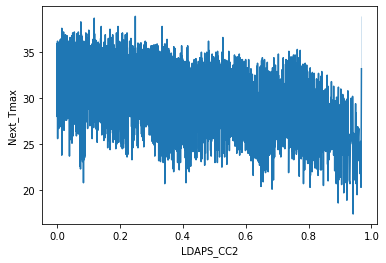

In [292]:
sns.lineplot(x='LDAPS_CC2',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmax'>

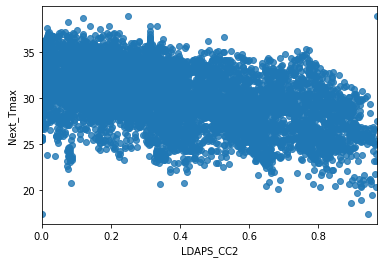

In [293]:
sns.regplot(x='LDAPS_CC2',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmax'>

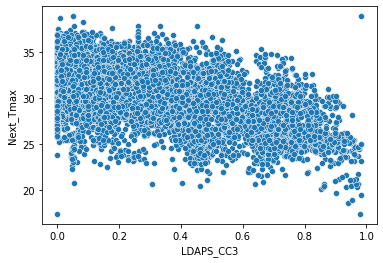

In [177]:
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmax'>

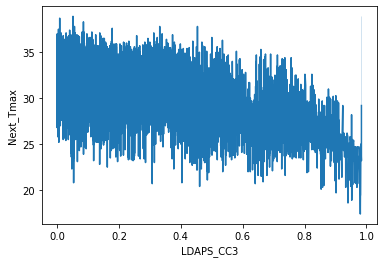

In [294]:
sns.lineplot(x='LDAPS_CC3',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmax'>

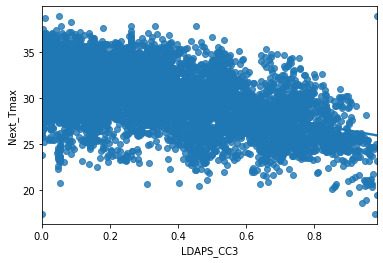

In [295]:
sns.regplot(x='LDAPS_CC3',y='Next_Tmax',data=df)

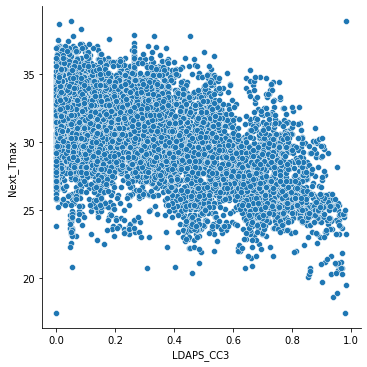

In [296]:
sns.relplot(x='LDAPS_CC3',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmax'>

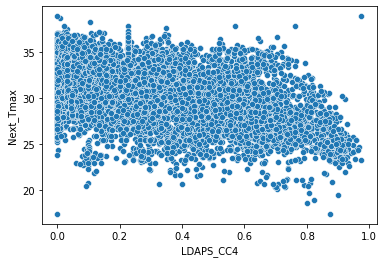

In [178]:
sns.scatterplot(x='LDAPS_CC4',y='Next_Tmax',data=df)

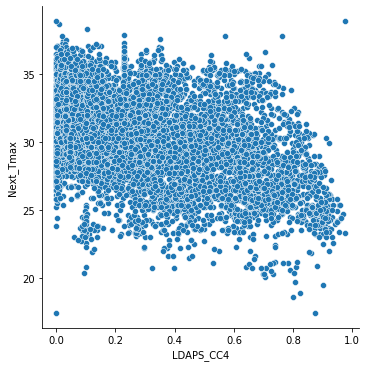

In [297]:
sns.relplot(x='LDAPS_CC4',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmax'>

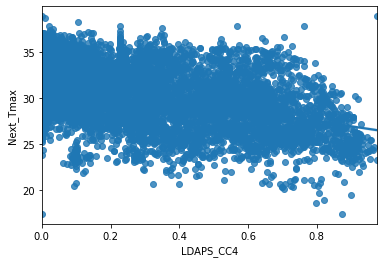

In [298]:
sns.regplot(x='LDAPS_CC4',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmax'>

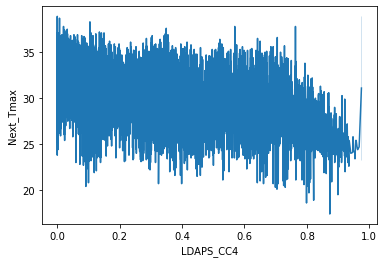

In [299]:
sns.lineplot(x='LDAPS_CC4',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Next_Tmax'>

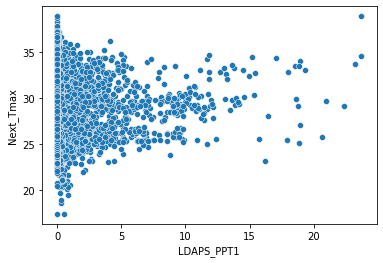

In [179]:
sns.scatterplot(x='LDAPS_PPT1',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Next_Tmax'>

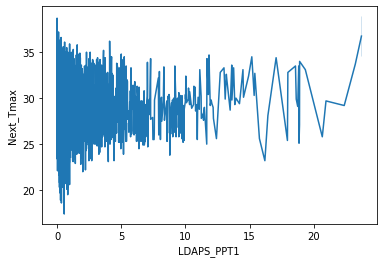

In [300]:
sns.lineplot(x='LDAPS_PPT1',y='Next_Tmax',data=df)

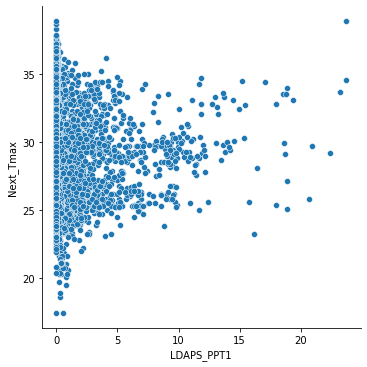

In [301]:
sns.relplot(x='LDAPS_PPT1',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Next_Tmax'>

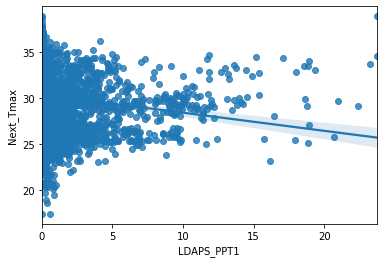

In [302]:
sns.regplot(x='LDAPS_PPT1',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Next_Tmax'>

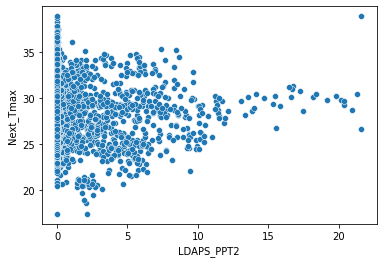

In [180]:
sns.scatterplot(x='LDAPS_PPT2',y='Next_Tmax',data=df)

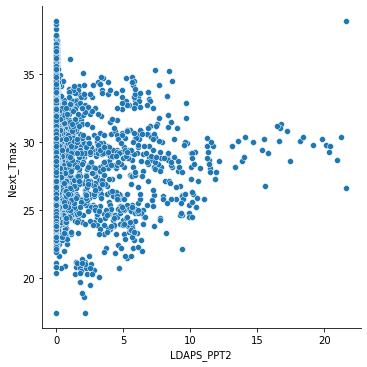

In [303]:
sns.relplot(x='LDAPS_PPT2',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Next_Tmax'>

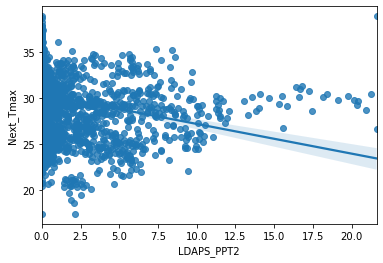

In [304]:
sns.regplot(x='LDAPS_PPT2',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Next_Tmax'>

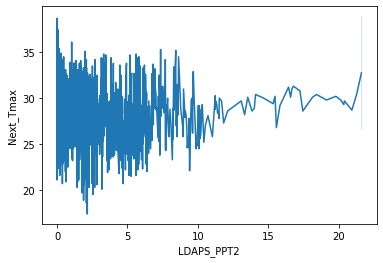

In [306]:
sns.lineplot(x='LDAPS_PPT2',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Next_Tmax'>

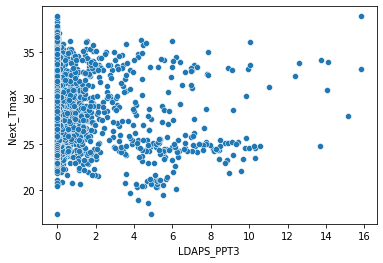

In [181]:
sns.scatterplot(x='LDAPS_PPT3',y='Next_Tmax',data=df)

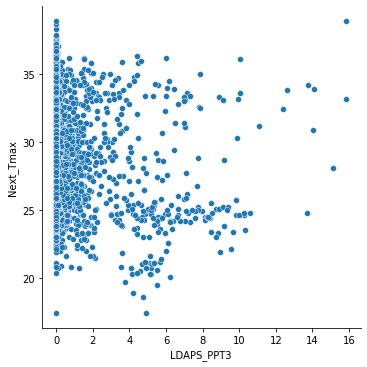

In [307]:
sns.relplot(x='LDAPS_PPT3',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Next_Tmax'>

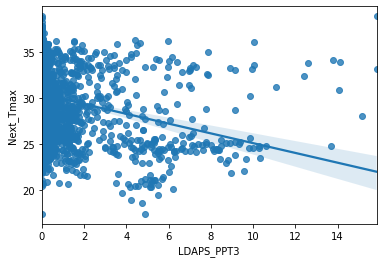

In [308]:
sns.regplot(x='LDAPS_PPT3',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Next_Tmax'>

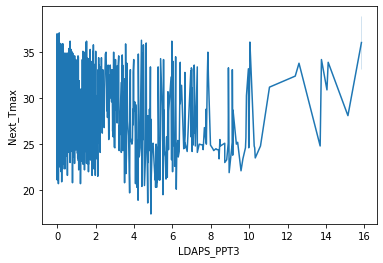

In [309]:
sns.lineplot(x='LDAPS_PPT3',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Next_Tmax'>

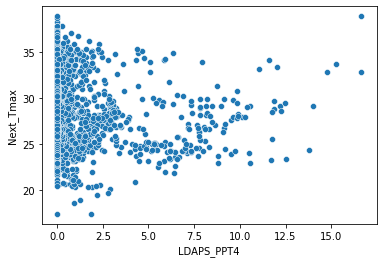

In [182]:
sns.scatterplot(x='LDAPS_PPT4',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Next_Tmax'>

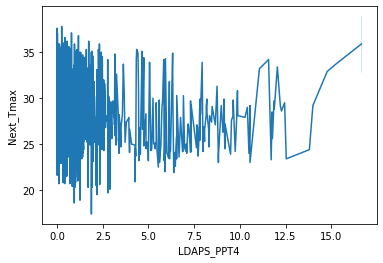

In [310]:
sns.lineplot(x='LDAPS_PPT4',y='Next_Tmax',data=df)

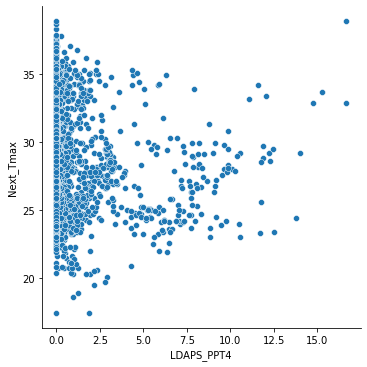

In [311]:
sns.relplot(x='LDAPS_PPT4',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Next_Tmax'>

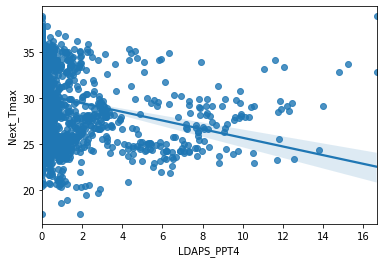

In [312]:
sns.regplot(x='LDAPS_PPT4',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmax'>

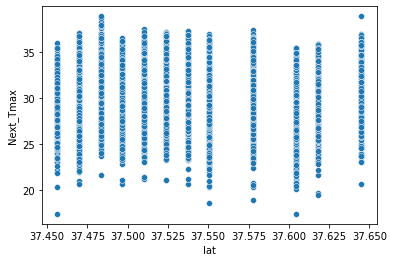

In [183]:
sns.scatterplot(x='lat',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmax'>

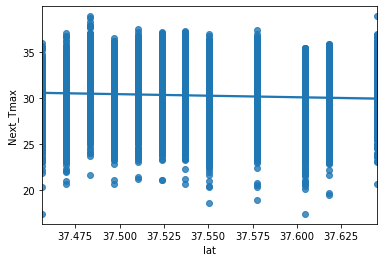

In [313]:
sns.regplot(x='lat',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmax'>

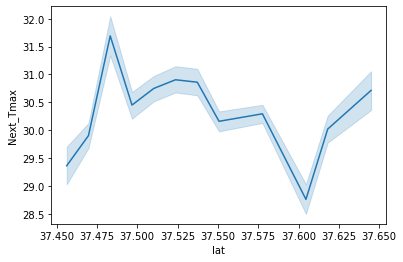

In [314]:
sns.lineplot(x='lat',y='Next_Tmax',data=df)

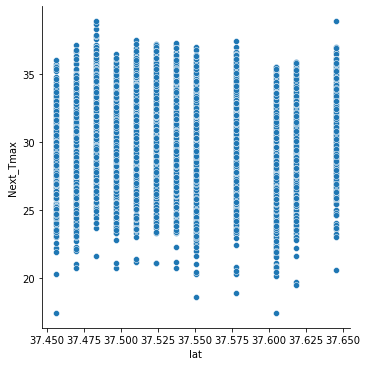

In [315]:
sns.relplot(x='lat',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmax'>

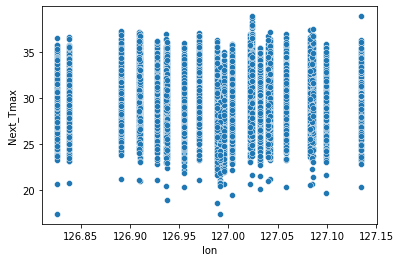

In [184]:
sns.scatterplot(x='lon',y='Next_Tmax',data=df)

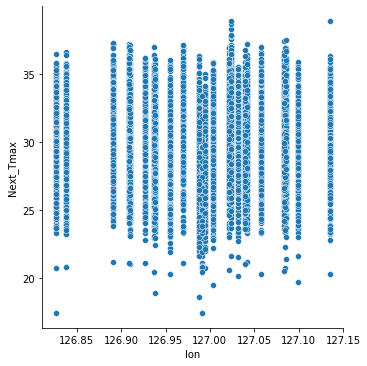

In [316]:
sns.relplot(x='lon',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmax'>

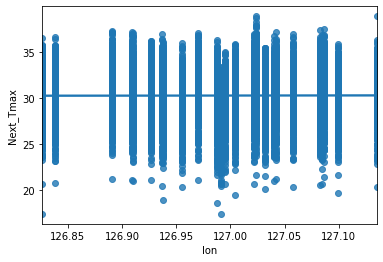

In [317]:
sns.regplot(x='lon',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmax'>

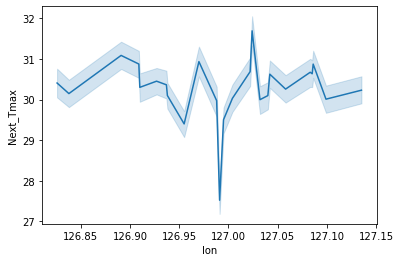

In [318]:
sns.lineplot(x='lon',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmax'>

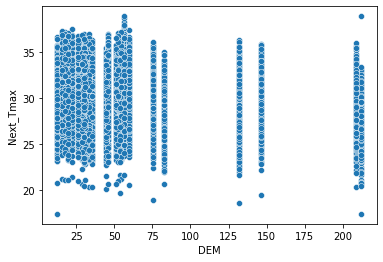

In [185]:
sns.scatterplot(x='DEM',y='Next_Tmax',data=df)

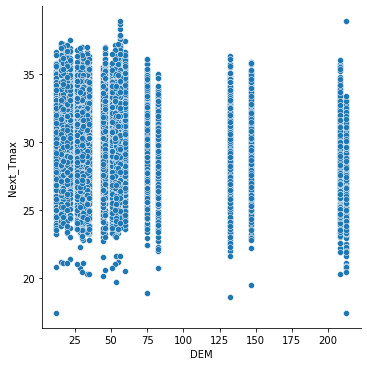

In [319]:
sns.relplot(x='DEM',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmax'>

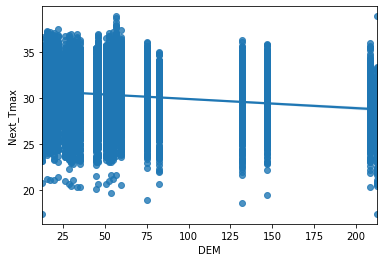

In [320]:
sns.regplot(x='DEM',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmax'>

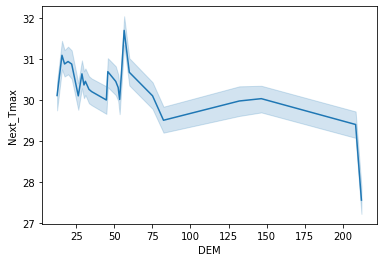

In [321]:
sns.lineplot(x='DEM',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmax'>

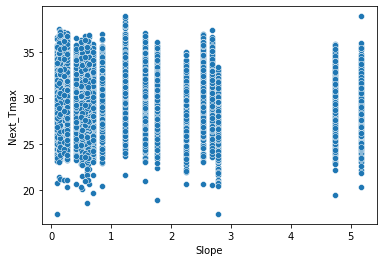

In [186]:
sns.scatterplot(x='Slope',y='Next_Tmax',data=df)

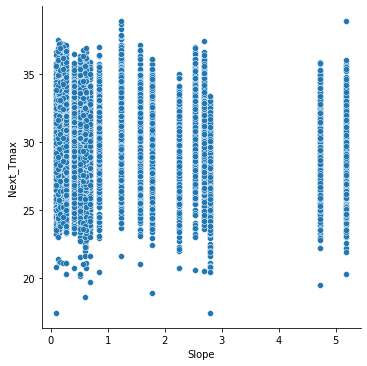

In [322]:
sns.relplot(x='Slope',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmax'>

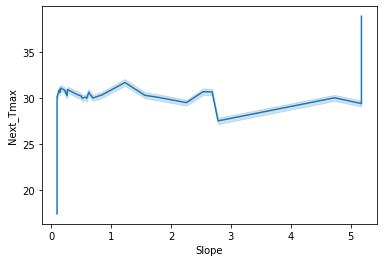

In [323]:
sns.lineplot(x='Slope',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmax'>

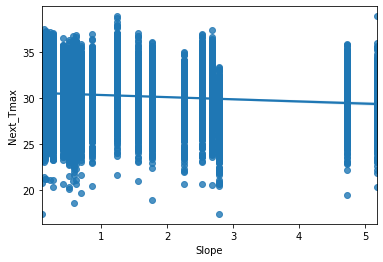

In [324]:
sns.regplot(x='Slope',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmax'>

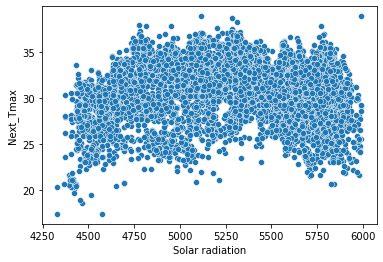

In [187]:
sns.scatterplot(x='Solar radiation',y='Next_Tmax',data=df)

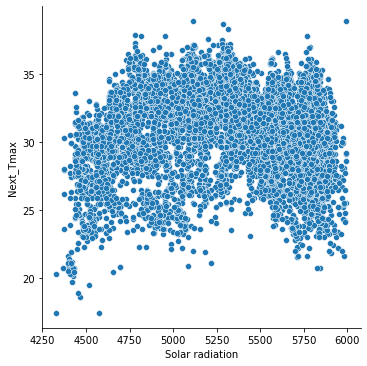

In [325]:
sns.relplot(x='Solar radiation',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmax'>

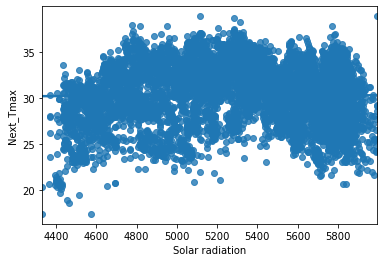

In [326]:
sns.regplot(x='Solar radiation',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmax'>

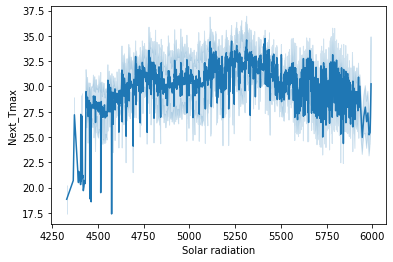

In [327]:
sns.lineplot(x='Solar radiation',y='Next_Tmax',data=df)

<AxesSubplot:xlabel='station', ylabel='Present_Tmax'>

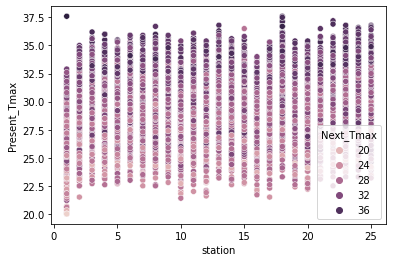

In [189]:
sns.scatterplot(x='station',y='Present_Tmax',hue='Next_Tmax',data=df)

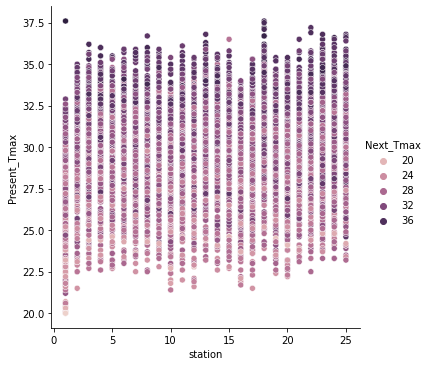

In [328]:
sns.relplot(x='station',y='Present_Tmax',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmin', ylabel='LDAPS_RHmin'>

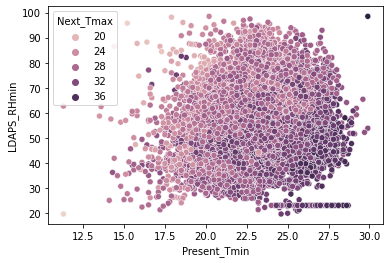

In [190]:
sns.scatterplot(x='Present_Tmin',y='LDAPS_RHmin',hue='Next_Tmax',data=df)

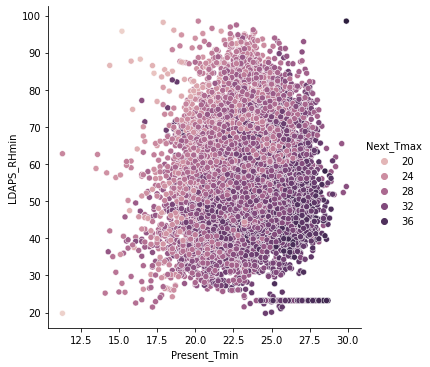

In [330]:
sns.relplot(x='Present_Tmin',y='LDAPS_RHmin',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='LDAPS_RHmin'>

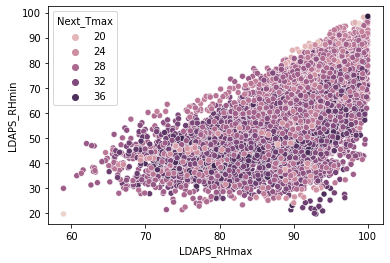

In [191]:
sns.scatterplot(x='LDAPS_RHmax',y='LDAPS_RHmin',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='LDAPS_CC1'>

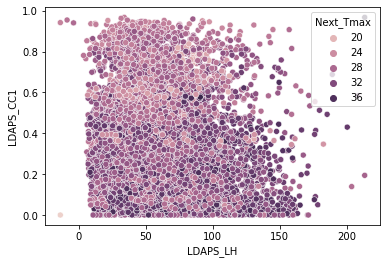

In [192]:
sns.scatterplot(x='LDAPS_LH',y='LDAPS_CC1',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='LDAPS_CC2'>

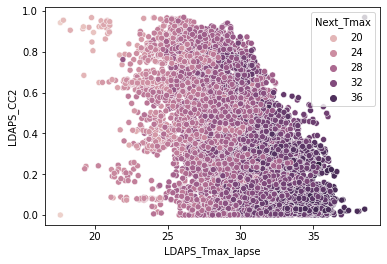

In [193]:
sns.scatterplot(x='LDAPS_Tmax_lapse',y='LDAPS_CC2',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Slope'>

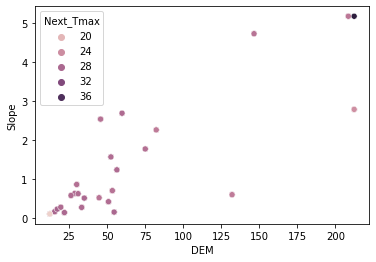

In [194]:
sns.scatterplot(x='DEM',y='Slope',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Solar radiation'>

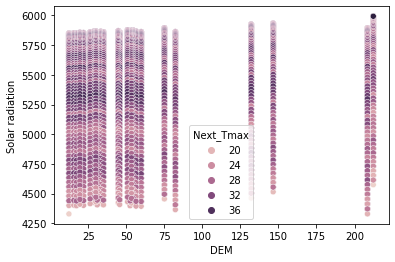

In [195]:
sns.scatterplot(x='DEM',y='Solar radiation',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='lat'>

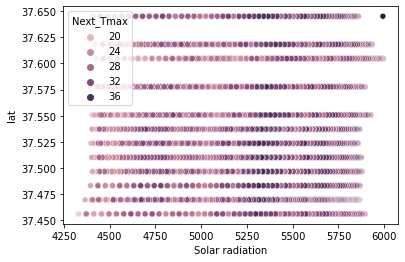

In [196]:
sns.scatterplot(x='Solar radiation',y='lat',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Present_Tmin'>

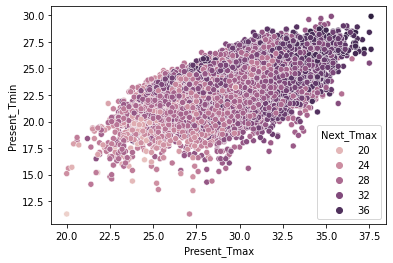

In [197]:
sns.scatterplot(x='Present_Tmax',y='Present_Tmin',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='LDAPS_RHmin'>

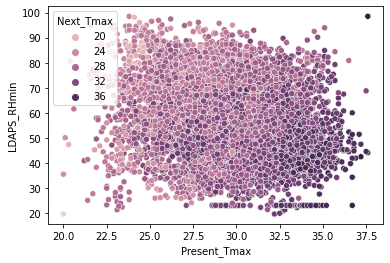

In [198]:
sns.scatterplot(x='Present_Tmax',y='LDAPS_RHmin',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='LDAPS_RHmax'>

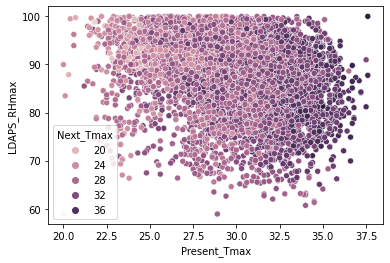

In [199]:
sns.scatterplot(x='Present_Tmax',y='LDAPS_RHmax',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='LDAPS_CC1'>

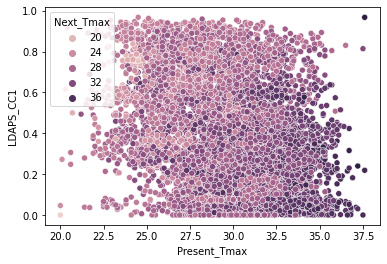

In [200]:
sns.scatterplot(x='Present_Tmax',y='LDAPS_CC1',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmin', ylabel='LDAPS_CC2'>

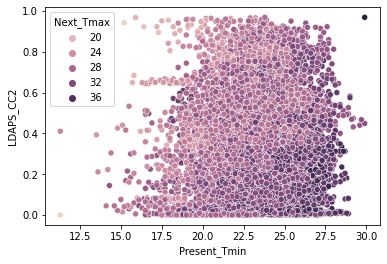

In [201]:
sns.scatterplot(x='Present_Tmin',y='LDAPS_CC2',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Present_Tmin', ylabel='LDAPS_CC3'>

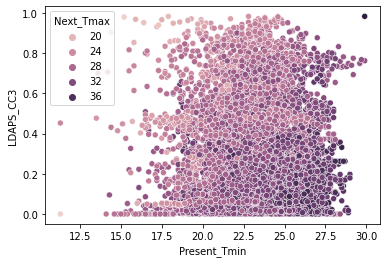

In [202]:
sns.scatterplot(x='Present_Tmin',y='LDAPS_CC3',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='lon', ylabel='DEM'>

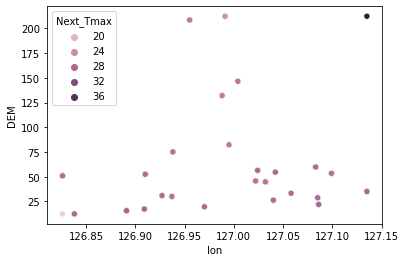

In [203]:
sns.scatterplot(x='lon',y='DEM',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Solar radiation'>

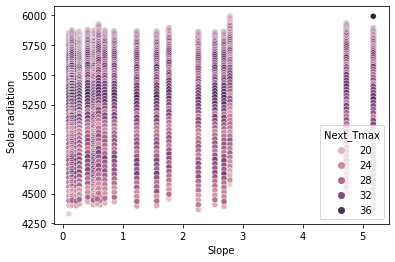

In [204]:
sns.scatterplot(x='Slope',y='Solar radiation',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='LDAPS_RHmin'>

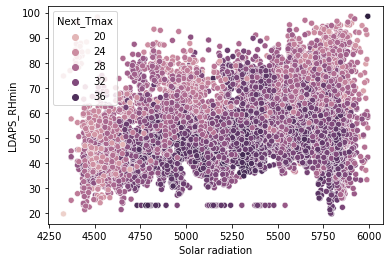

In [205]:
sns.scatterplot(x='Solar radiation',y='LDAPS_RHmin',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmin'>

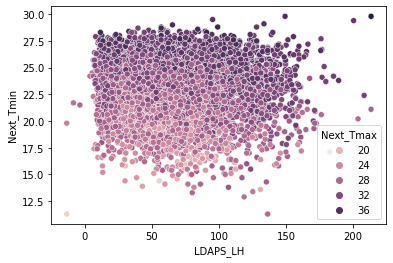

In [206]:
sns.scatterplot(x='LDAPS_LH',y='Next_Tmin',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_CC2'>

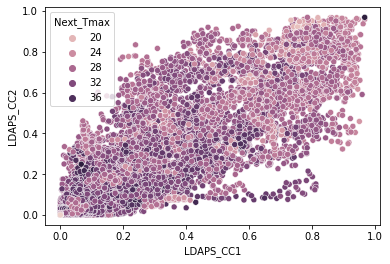

In [207]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_CC2',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='LDAPS_CC3'>

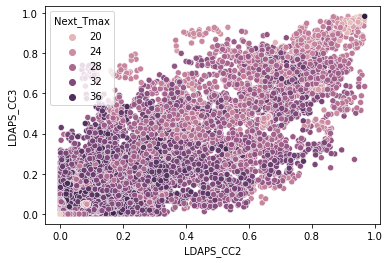

In [208]:
sns.scatterplot(x='LDAPS_CC2',y='LDAPS_CC3',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_CC3'>

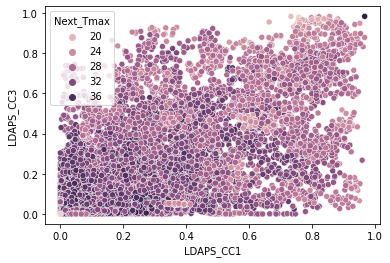

In [209]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_CC3',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_CC4'>

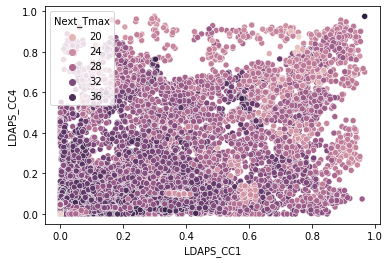

In [210]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_CC4',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='LDAPS_CC4'>

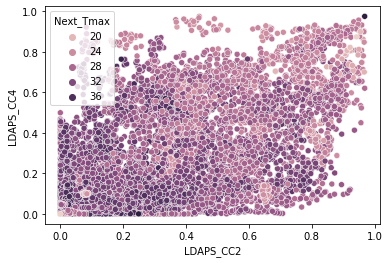

In [211]:
sns.scatterplot(x='LDAPS_CC2',y='LDAPS_CC4',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='LDAPS_CC4'>

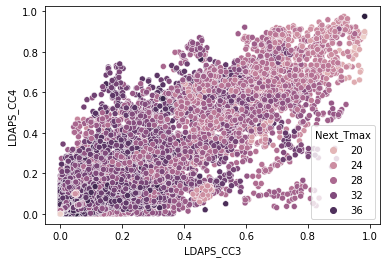

In [212]:
sns.scatterplot(x='LDAPS_CC3',y='LDAPS_CC4',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_PPT1'>

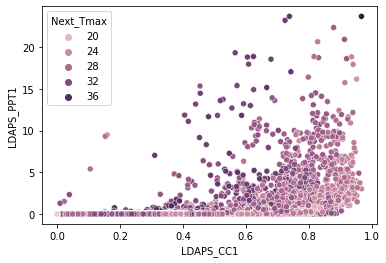

In [213]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_PPT1',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='lat', ylabel='lon'>

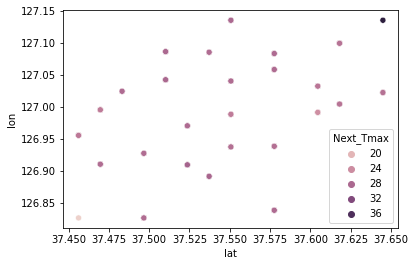

In [214]:
sns.scatterplot(x='lat',y='lon',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='LDAPS_PPT2'>

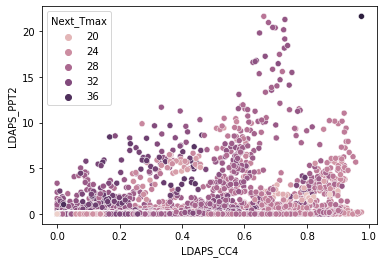

In [215]:
sns.scatterplot(x='LDAPS_CC4',y='LDAPS_PPT2',hue='Next_Tmax',data=df)

<AxesSubplot:xlabel='station', ylabel='Present_Tmax'>

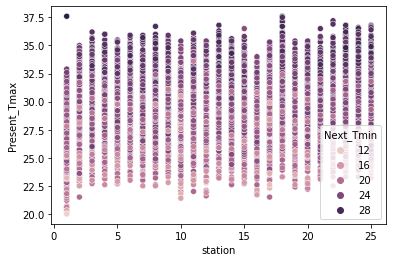

In [217]:
sns.scatterplot(x='station',y='Present_Tmax',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='station', ylabel='Present_Tmin'>

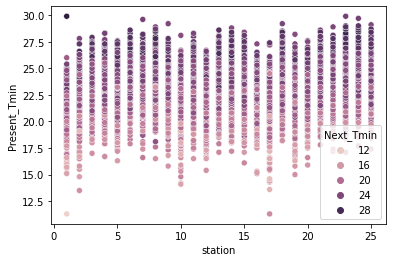

In [218]:
sns.scatterplot(x='station',y='Present_Tmin',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Present_Tmin'>

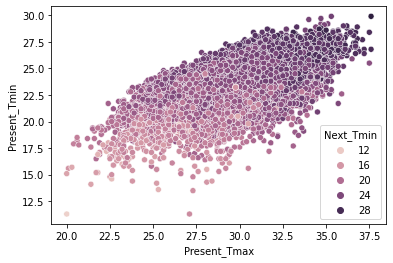

In [219]:
sns.scatterplot(x='Present_Tmax',y='Present_Tmin',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Present_Tmin'>

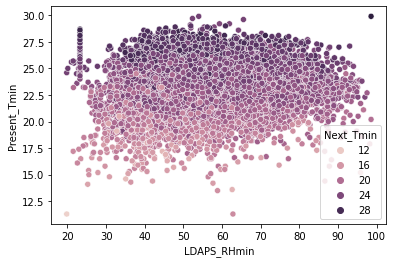

In [220]:
sns.scatterplot(x='LDAPS_RHmin',y='Present_Tmin',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='LDAPS_Tmax_lapse'>

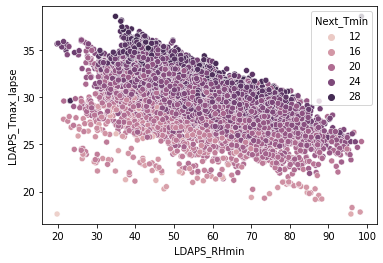

In [221]:
sns.scatterplot(x='LDAPS_RHmin',y='LDAPS_Tmax_lapse',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='LDAPS_WS'>

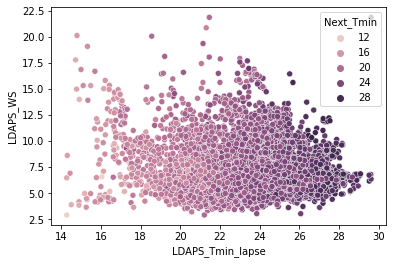

In [222]:
sns.scatterplot(x='LDAPS_Tmin_lapse',y='LDAPS_WS',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='LDAPS_PPT1'>

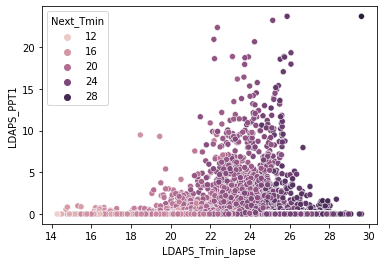

In [223]:
sns.scatterplot(x='LDAPS_Tmin_lapse',y='LDAPS_PPT1',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='LDAPS_CC1'>

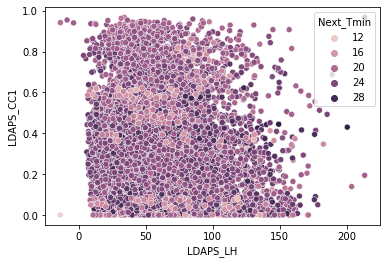

In [225]:
sns.scatterplot(x='LDAPS_LH',y='LDAPS_CC1',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='LDAPS_CC2'>

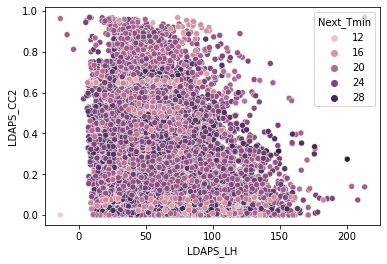

In [226]:
sns.scatterplot(x='LDAPS_LH',y='LDAPS_CC2',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_CC2'>

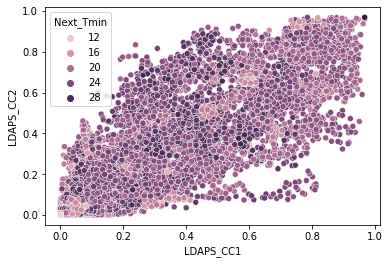

In [227]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_CC2',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_CC3'>

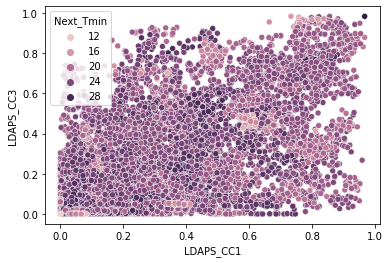

In [228]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_CC3',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='LDAPS_CC3'>

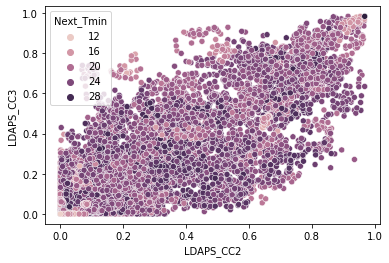

In [229]:
sns.scatterplot(x='LDAPS_CC2',y='LDAPS_CC3',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='LDAPS_CC4'>

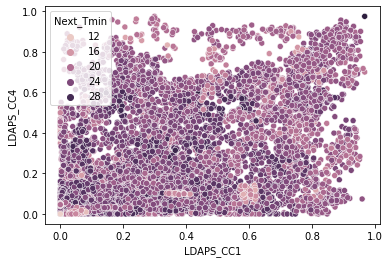

In [230]:
sns.scatterplot(x='LDAPS_CC1',y='LDAPS_CC4',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='LDAPS_CC4'>

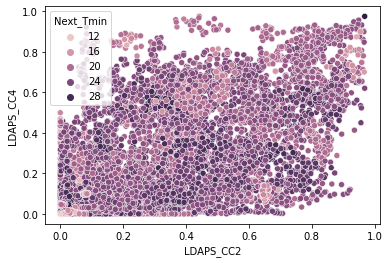

In [231]:
sns.scatterplot(x='LDAPS_CC2',y='LDAPS_CC4',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='LDAPS_CC4'>

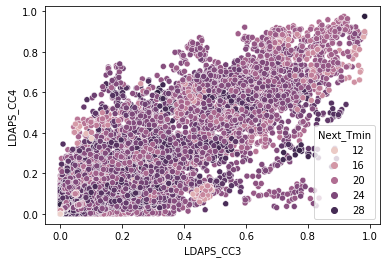

In [232]:
sns.scatterplot(x='LDAPS_CC3',y='LDAPS_CC4',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='LDAPS_PPT2'>

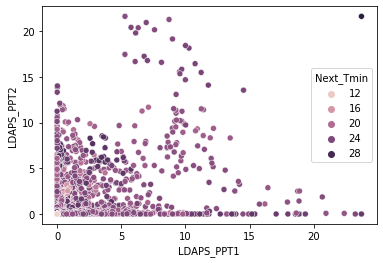

In [233]:
sns.scatterplot(x='LDAPS_PPT1',y='LDAPS_PPT2',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='LDAPS_PPT3'>

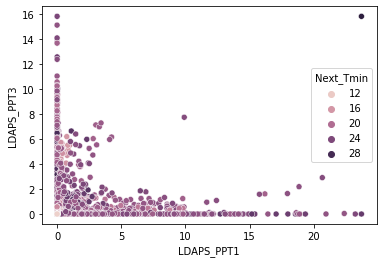

In [234]:
sns.scatterplot(x='LDAPS_PPT1',y='LDAPS_PPT3',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='LDAPS_PPT4'>

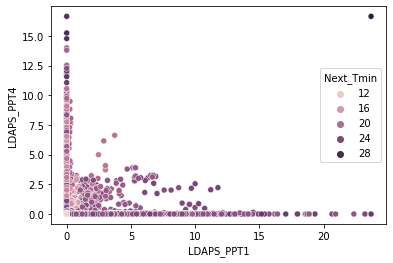

In [235]:
sns.scatterplot(x='LDAPS_PPT1',y='LDAPS_PPT4',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='LDAPS_PPT3'>

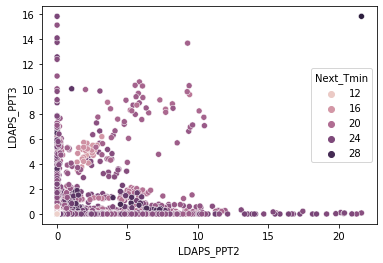

In [236]:
sns.scatterplot(x='LDAPS_PPT2',y='LDAPS_PPT3',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='LDAPS_PPT4'>

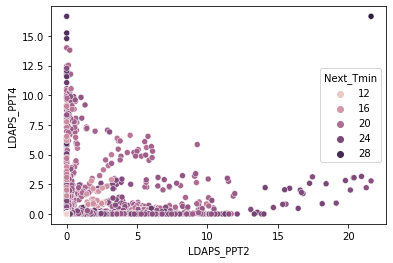

In [237]:
sns.scatterplot(x='LDAPS_PPT2',y='LDAPS_PPT4',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='LDAPS_PPT4'>

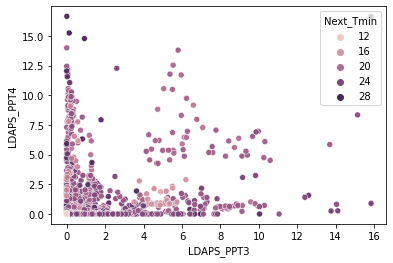

In [238]:
sns.scatterplot(x='LDAPS_PPT3',y='LDAPS_PPT4',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='lon'>

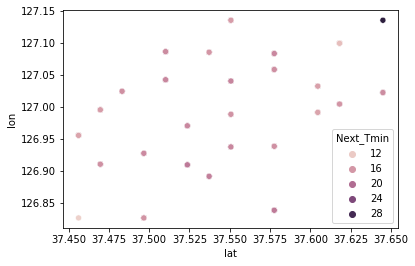

In [239]:
sns.scatterplot(x='lat',y='lon',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='DEM'>

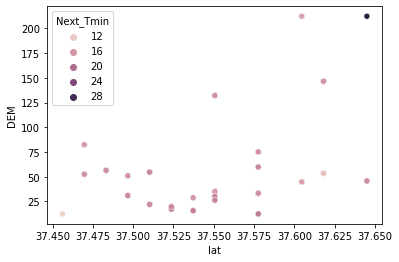

In [240]:
sns.scatterplot(x='lat',y='DEM',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Slope'>

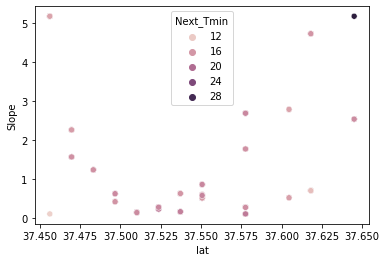

In [241]:
sns.scatterplot(x='lat',y='Slope',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Solar radiation'>

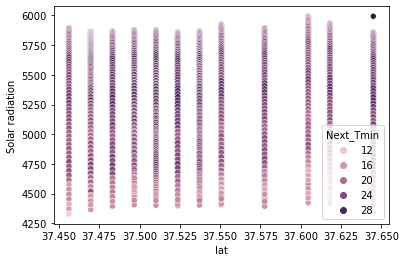

In [242]:
sns.scatterplot(x='lat',y='Solar radiation',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmax'>

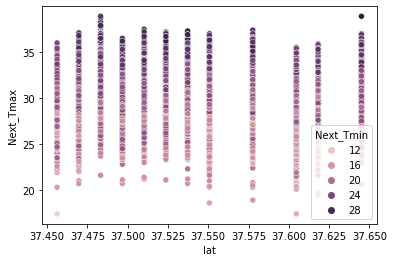

In [243]:
sns.scatterplot(x='lat',y='Next_Tmax',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmax'>

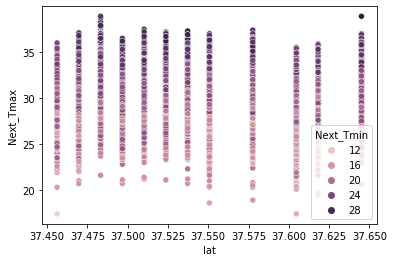

In [244]:
sns.scatterplot(x='lat',y='Next_Tmax',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='DEM'>

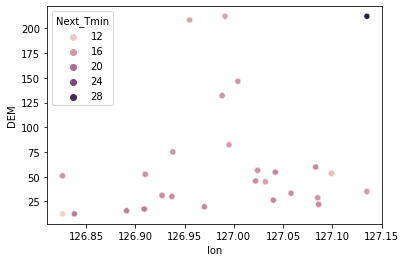

In [245]:
sns.scatterplot(x='lon',y='DEM',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='Slope'>

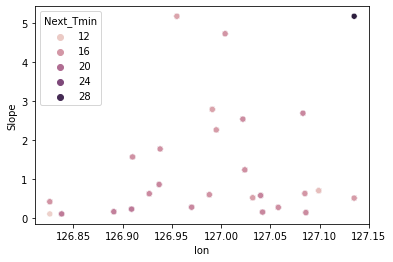

In [246]:
sns.scatterplot(x='lon',y='Slope',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='Solar radiation'>

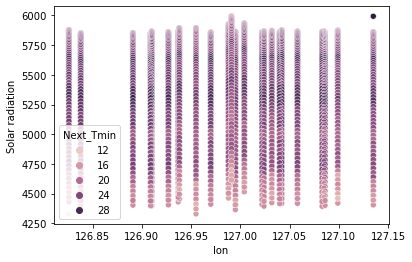

In [247]:
sns.scatterplot(x='lon',y='Solar radiation',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmax'>

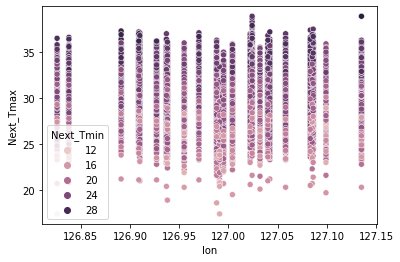

In [248]:
sns.scatterplot(x='lon',y='Next_Tmax',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Slope'>

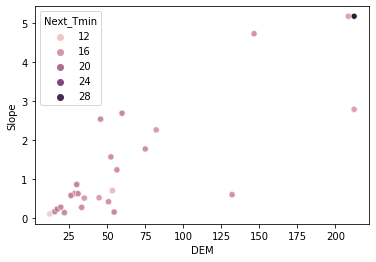

In [249]:
sns.scatterplot(x='DEM',y='Slope',hue='Next_Tmin',data=df)

<AxesSubplot:xlabel='station', ylabel='Next_Tmin'>

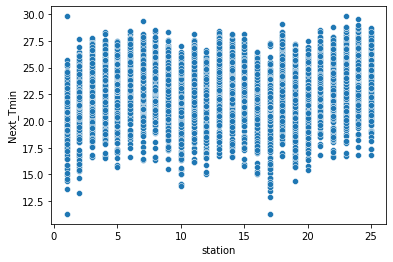

In [251]:
sns.scatterplot(x='station',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='station', ylabel='Next_Tmin'>

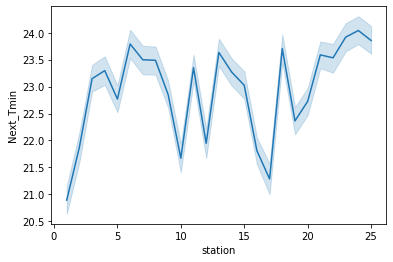

In [332]:
sns.lineplot(x='station',y='Next_Tmin',data=df)

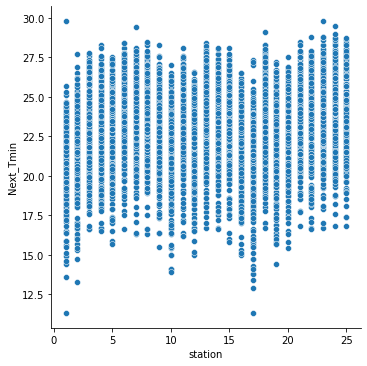

In [333]:
sns.relplot(x='station',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='station', ylabel='Next_Tmin'>

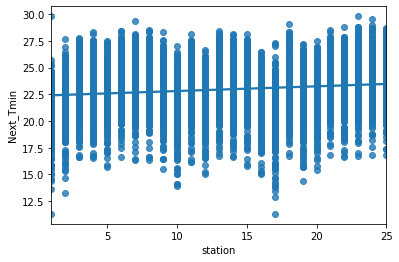

In [334]:
sns.regplot(x='station',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Next_Tmin'>

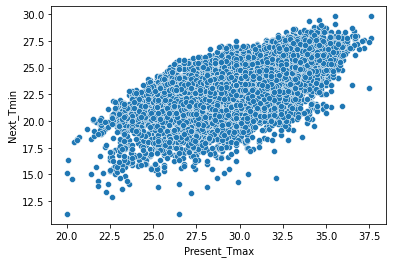

In [252]:
sns.scatterplot(x='Present_Tmax',y='Next_Tmin',data=df)

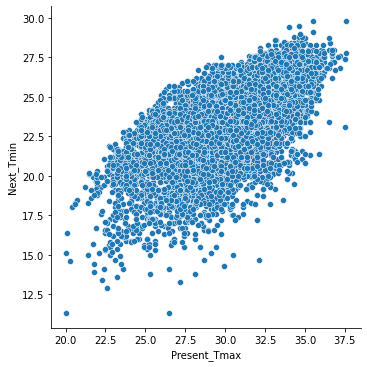

In [335]:
sns.relplot(x='Present_Tmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Next_Tmin'>

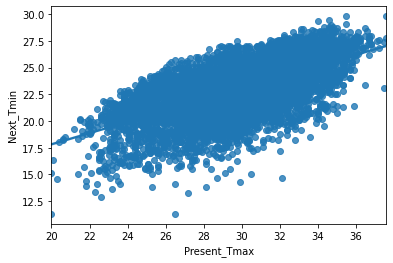

In [336]:
sns.regplot(x='Present_Tmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmax', ylabel='Next_Tmin'>

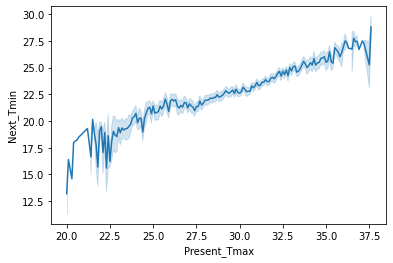

In [337]:
sns.lineplot(x='Present_Tmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmin', ylabel='Next_Tmin'>

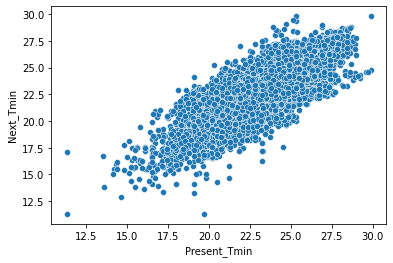

In [253]:
sns.scatterplot(x='Present_Tmin',y='Next_Tmin',data=df)

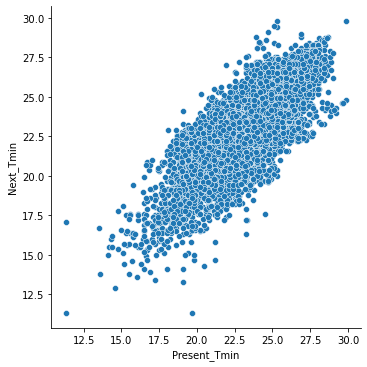

In [338]:
sns.relplot(x='Present_Tmin',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmin', ylabel='Next_Tmin'>

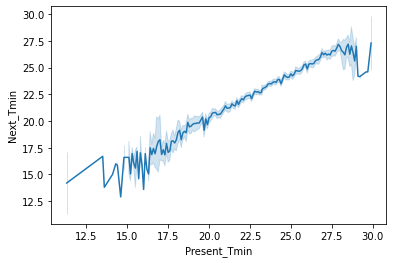

In [339]:
sns.lineplot(x='Present_Tmin',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Present_Tmin', ylabel='Next_Tmin'>

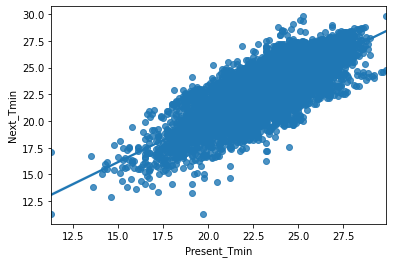

In [340]:
sns.regplot(x='Present_Tmin',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Next_Tmin'>

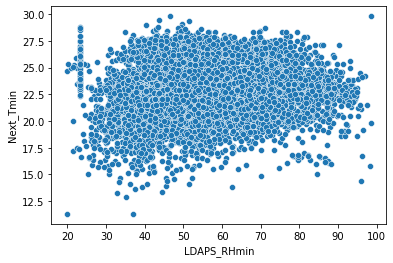

In [254]:
sns.scatterplot(x='LDAPS_RHmin',y='Next_Tmin',data=df)

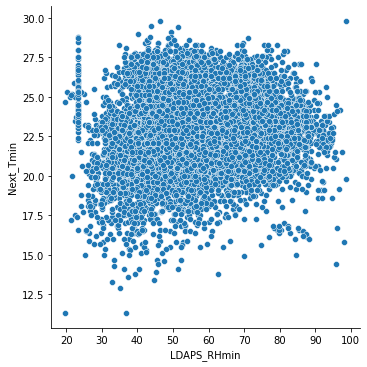

In [341]:
sns.relplot(x='LDAPS_RHmin',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Next_Tmin'>

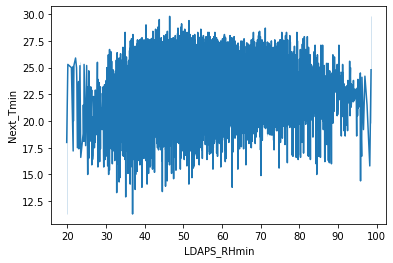

In [342]:
sns.lineplot(x='LDAPS_RHmin',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Next_Tmin'>

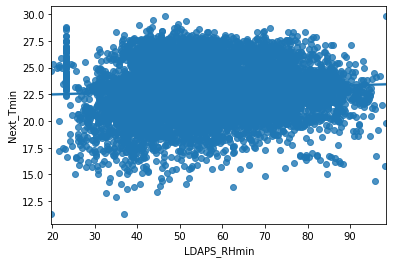

In [343]:
sns.regplot(x='LDAPS_RHmin',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Next_Tmin'>

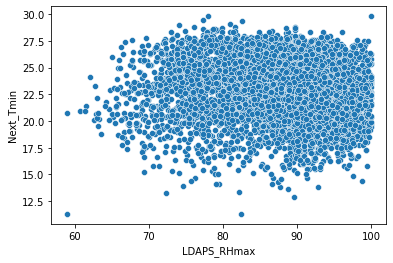

In [255]:
sns.scatterplot(x='LDAPS_RHmax',y='Next_Tmin',data=df)

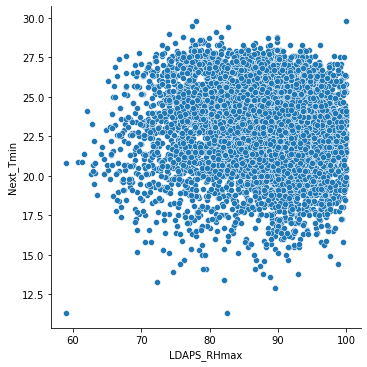

In [344]:
sns.relplot(x='LDAPS_RHmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Next_Tmin'>

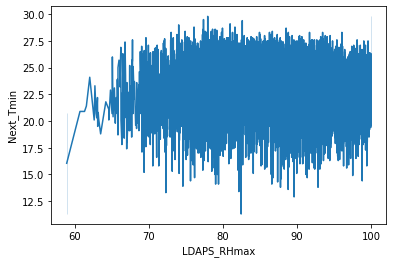

In [345]:
sns.lineplot(x='LDAPS_RHmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Next_Tmin'>

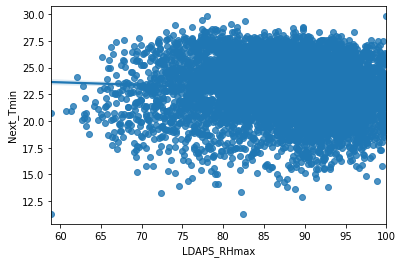

In [346]:
sns.regplot(x='LDAPS_RHmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Next_Tmin'>

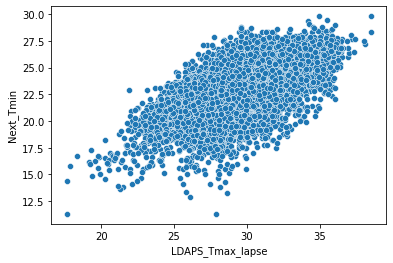

In [256]:
sns.scatterplot(x='LDAPS_Tmax_lapse',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Next_Tmin'>

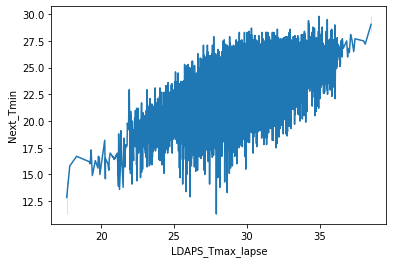

In [347]:
sns.lineplot(x='LDAPS_Tmax_lapse',y='Next_Tmin',data=df)

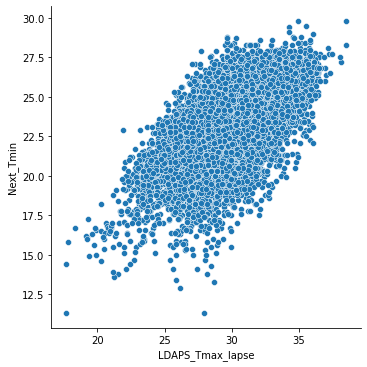

In [348]:
sns.relplot(x='LDAPS_Tmax_lapse',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Next_Tmin'>

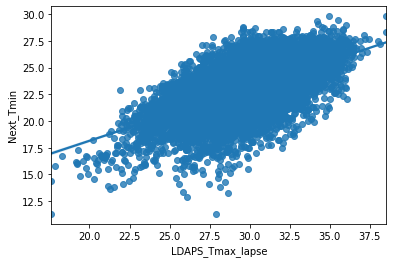

In [349]:
sns.regplot(x='LDAPS_Tmax_lapse',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmin'>

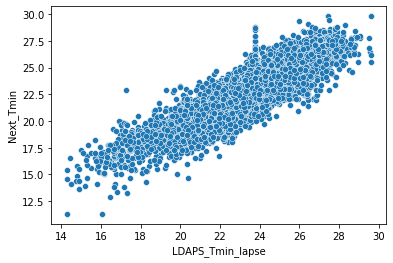

In [257]:
sns.scatterplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df)

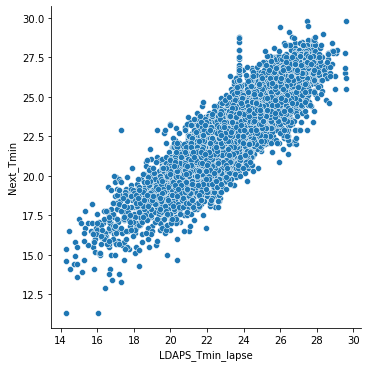

In [350]:
sns.relplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmin'>

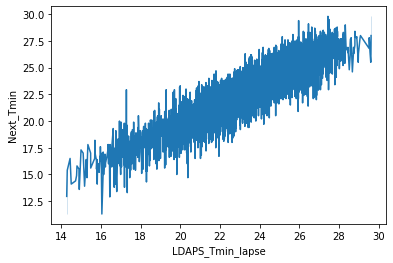

In [351]:
sns.lineplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Next_Tmin'>

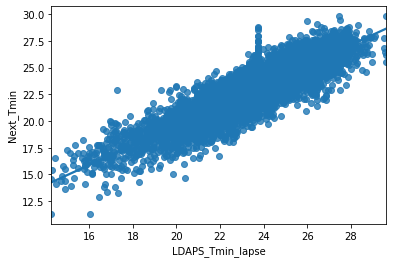

In [352]:
sns.regplot(x='LDAPS_Tmin_lapse',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmin'>

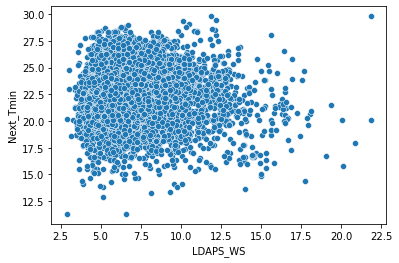

In [258]:
sns.scatterplot(x='LDAPS_WS',y='Next_Tmin',data=df)

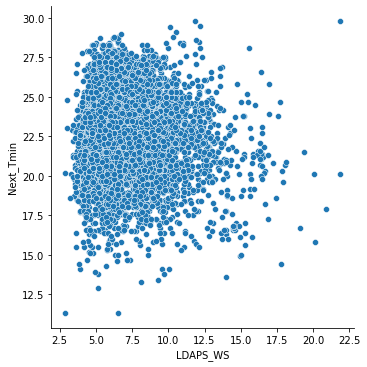

In [353]:
sns.relplot(x='LDAPS_WS',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmin'>

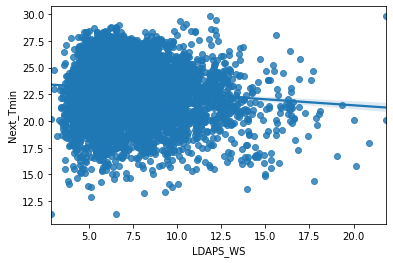

In [354]:
sns.regplot(x='LDAPS_WS',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Next_Tmin'>

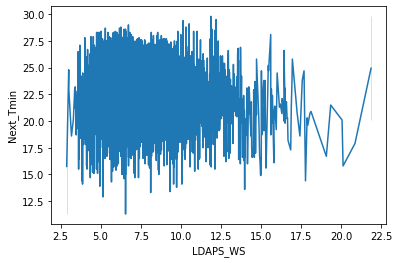

In [355]:
sns.lineplot(x='LDAPS_WS',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmin'>

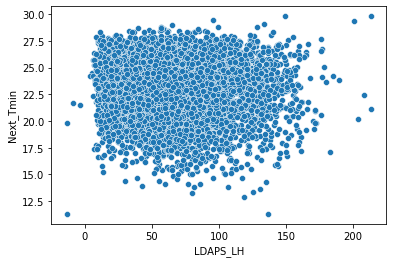

In [259]:
sns.scatterplot(x='LDAPS_LH',y='Next_Tmin',data=df)

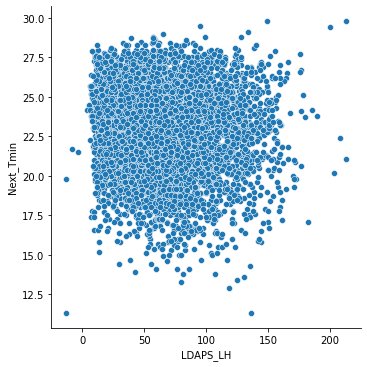

In [356]:
sns.relplot(x='LDAPS_LH',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmin'>

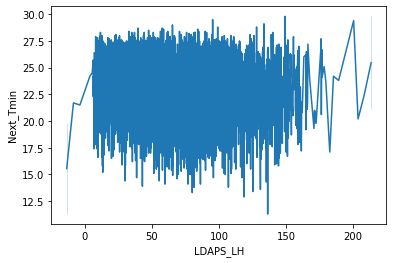

In [357]:
sns.lineplot(x='LDAPS_LH',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Next_Tmin'>

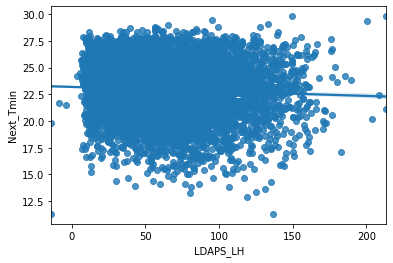

In [358]:
sns.regplot(x='LDAPS_LH',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmin'>

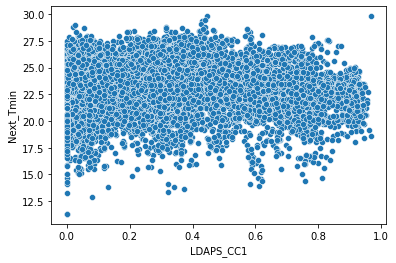

In [260]:
sns.scatterplot(x='LDAPS_CC1',y='Next_Tmin',data=df)

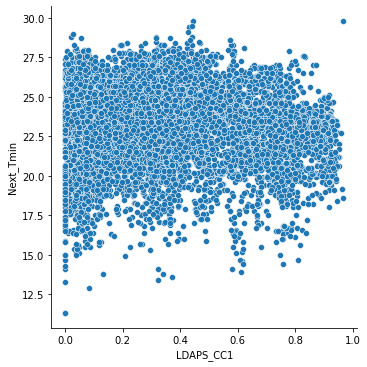

In [359]:
sns.relplot(x='LDAPS_CC1',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmin'>

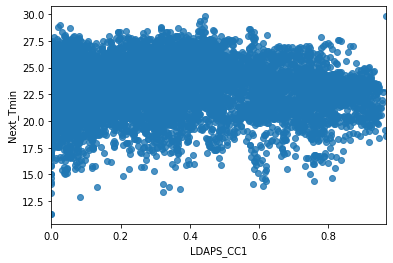

In [360]:
sns.regplot(x='LDAPS_CC1',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Next_Tmin'>

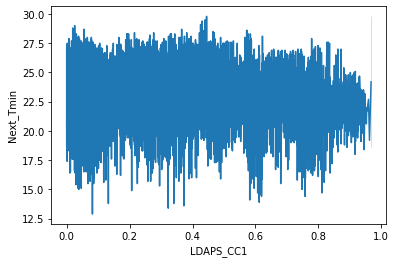

In [361]:
sns.lineplot(x='LDAPS_CC1',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmin'>

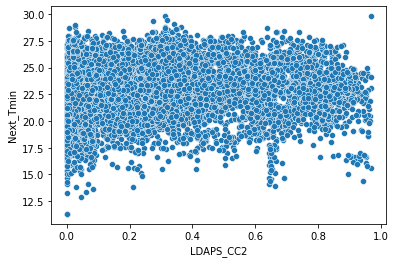

In [261]:
sns.scatterplot(x='LDAPS_CC2',y='Next_Tmin',data=df)

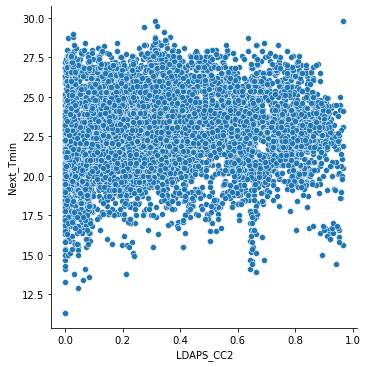

In [362]:
sns.relplot(x='LDAPS_CC2',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmin'>

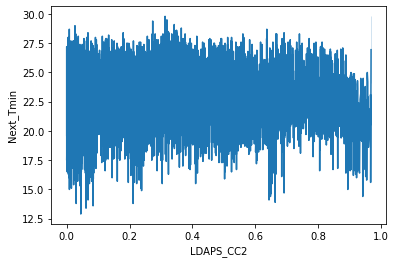

In [363]:
sns.lineplot(x='LDAPS_CC2',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Next_Tmin'>

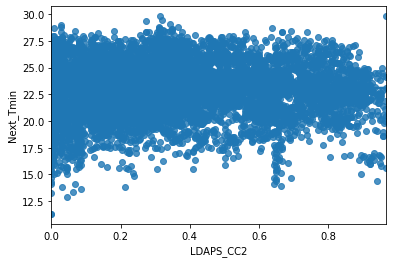

In [364]:
sns.regplot(x='LDAPS_CC2',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

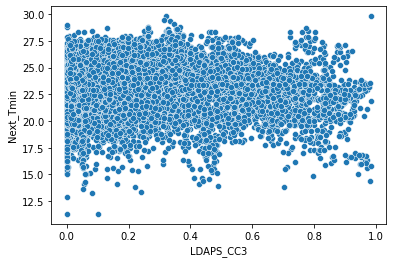

In [262]:
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

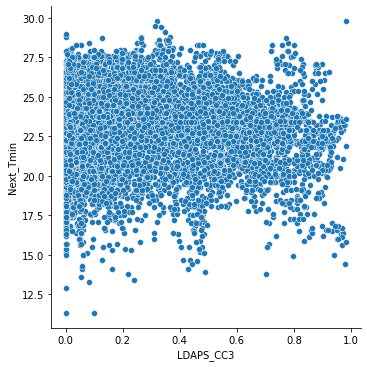

In [365]:
sns.relplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

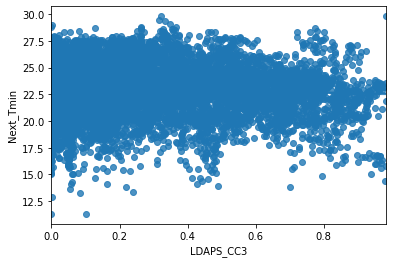

In [366]:
sns.regplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

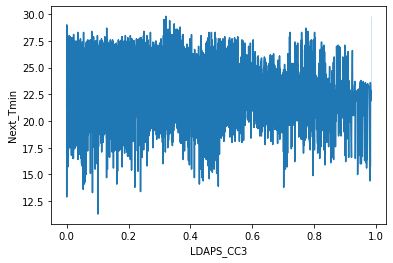

In [367]:
sns.lineplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

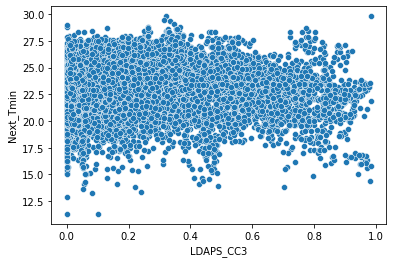

In [263]:
sns.scatterplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

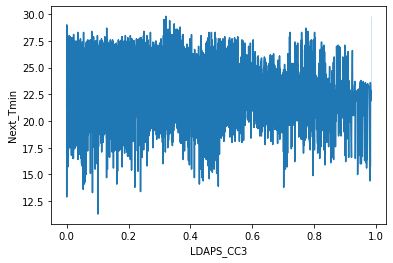

In [368]:
sns.lineplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Next_Tmin'>

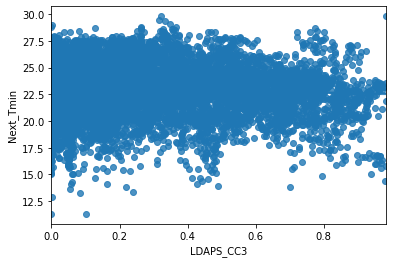

In [369]:
sns.regplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

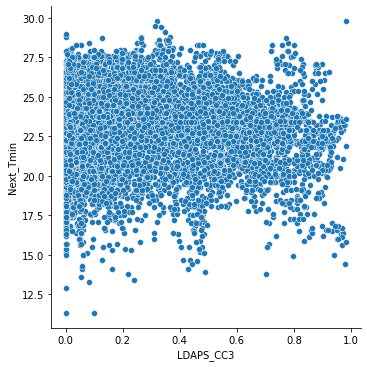

In [370]:
sns.relplot(x='LDAPS_CC3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmin'>

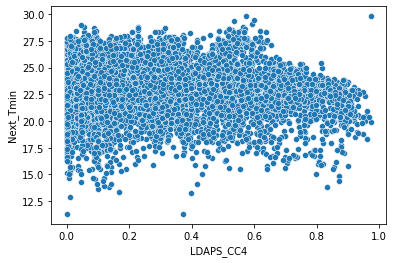

In [264]:
sns.scatterplot(x='LDAPS_CC4',y='Next_Tmin',data=df)

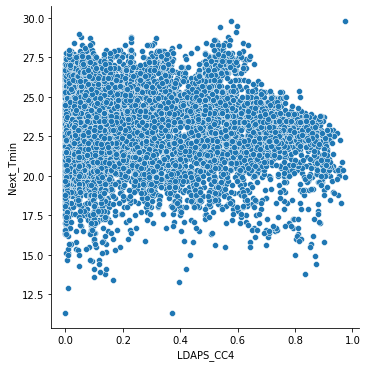

In [371]:
sns.relplot(x='LDAPS_CC4',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmin'>

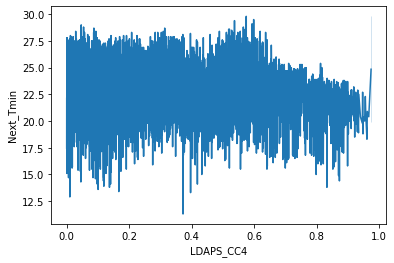

In [372]:
sns.lineplot(x='LDAPS_CC4',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Next_Tmin'>

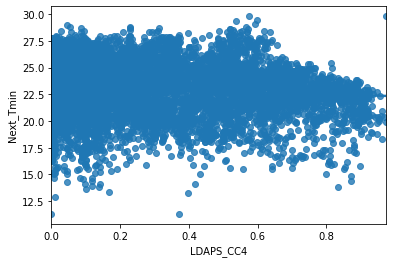

In [373]:
sns.regplot(x='LDAPS_CC4',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Next_Tmin'>

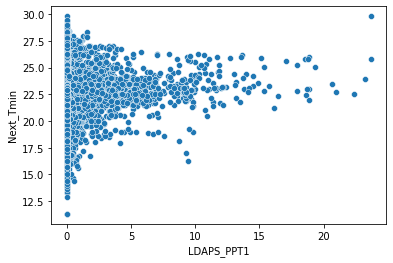

In [265]:
sns.scatterplot(x='LDAPS_PPT1',y='Next_Tmin',data=df)

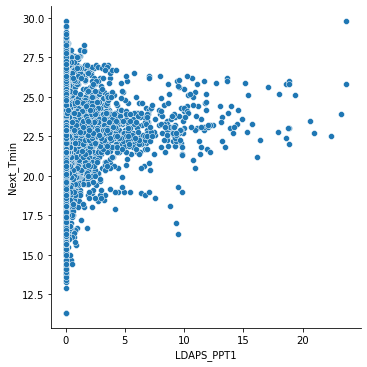

In [374]:
sns.relplot(x='LDAPS_PPT1',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Next_Tmin'>

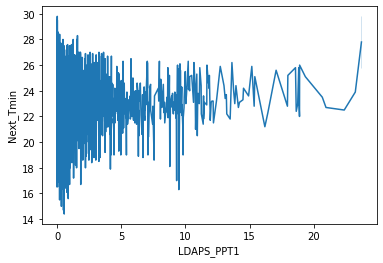

In [375]:
sns.lineplot(x='LDAPS_PPT1',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Next_Tmin'>

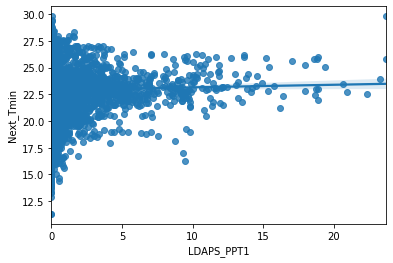

In [376]:
sns.regplot(x='LDAPS_PPT1',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Next_Tmin'>

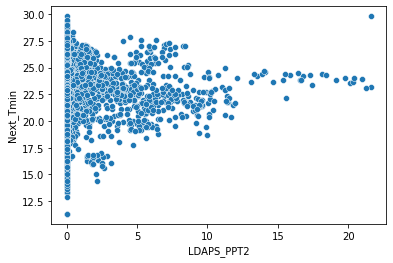

In [266]:
sns.scatterplot(x='LDAPS_PPT2',y='Next_Tmin',data=df)

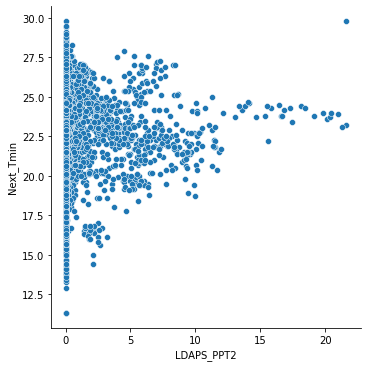

In [377]:
sns.relplot(x='LDAPS_PPT2',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Next_Tmin'>

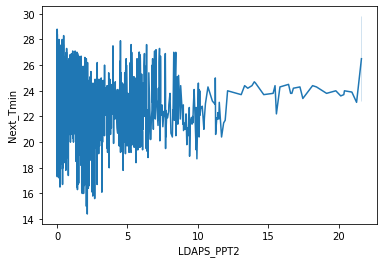

In [378]:
sns.lineplot(x='LDAPS_PPT2',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Next_Tmin'>

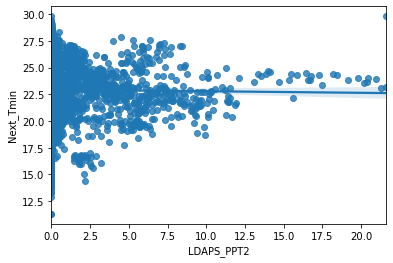

In [379]:
sns.regplot(x='LDAPS_PPT2',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Next_Tmin'>

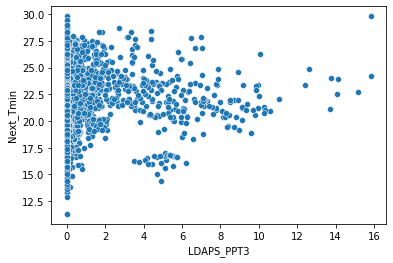

In [267]:
sns.scatterplot(x='LDAPS_PPT3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Next_Tmin'>

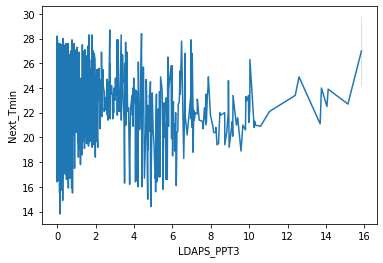

In [380]:
sns.lineplot(x='LDAPS_PPT3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Next_Tmin'>

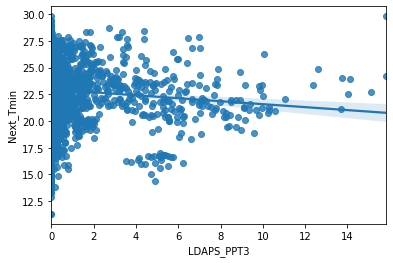

In [381]:
sns.regplot(x='LDAPS_PPT3',y='Next_Tmin',data=df)

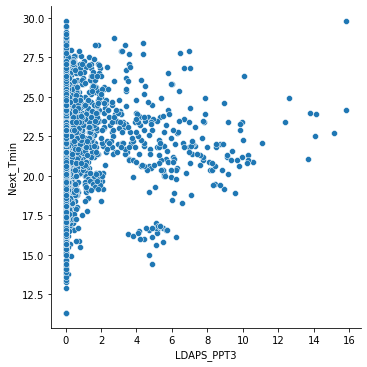

In [382]:
sns.relplot(x='LDAPS_PPT3',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Next_Tmin'>

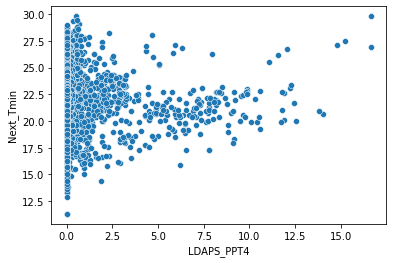

In [268]:
sns.scatterplot(x='LDAPS_PPT4',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Next_Tmin'>

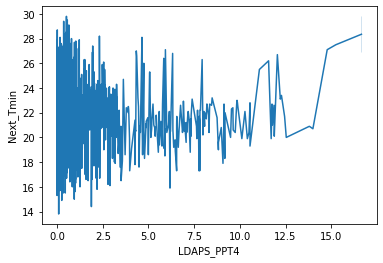

In [383]:
sns.lineplot(x='LDAPS_PPT4',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Next_Tmin'>

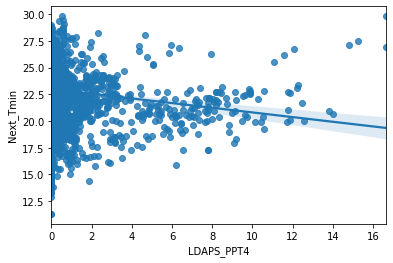

In [384]:
sns.regplot(x='LDAPS_PPT4',y='Next_Tmin',data=df)

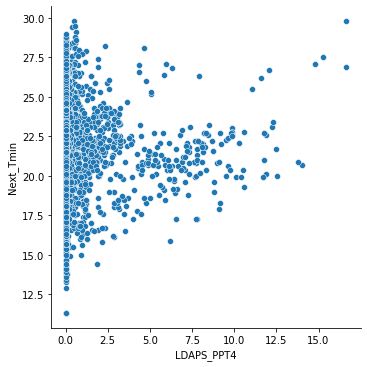

In [385]:
sns.relplot(x='LDAPS_PPT4',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmin'>

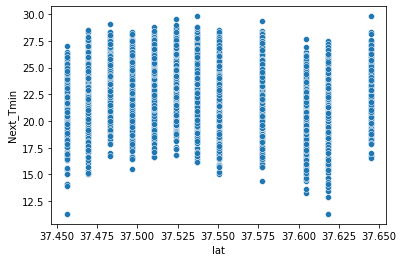

In [269]:
sns.scatterplot(x='lat',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmin'>

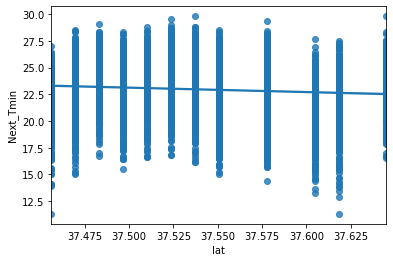

In [386]:
sns.regplot(x='lat',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='lat', ylabel='Next_Tmin'>

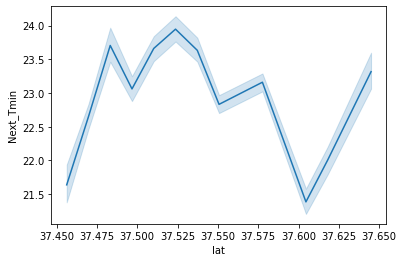

In [387]:
sns.lineplot(x='lat',y='Next_Tmin',data=df)

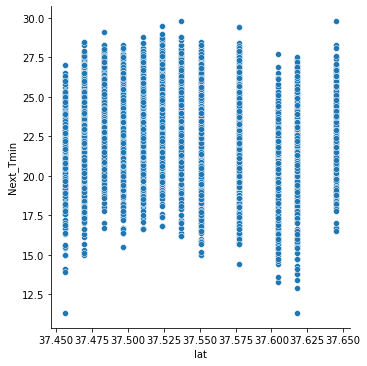

In [388]:
sns.relplot(x='lat',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmin'>

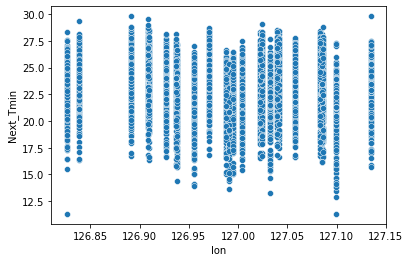

In [270]:
sns.scatterplot(x='lon',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmin'>

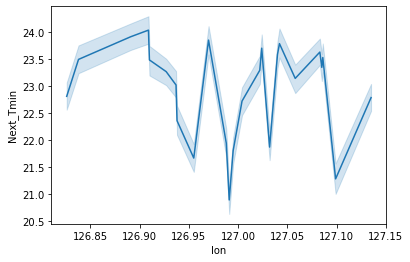

In [389]:
sns.lineplot(x='lon',y='Next_Tmin',data=df)

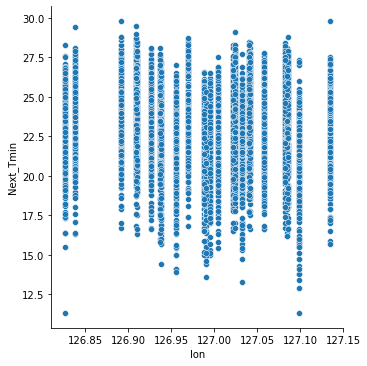

In [390]:
sns.relplot(x='lon',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='lon', ylabel='Next_Tmin'>

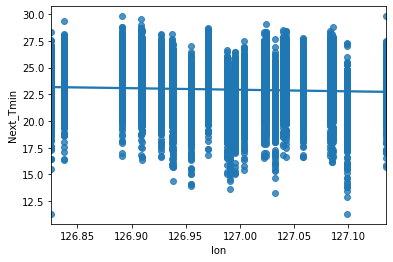

In [391]:
sns.regplot(x='lon',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmin'>

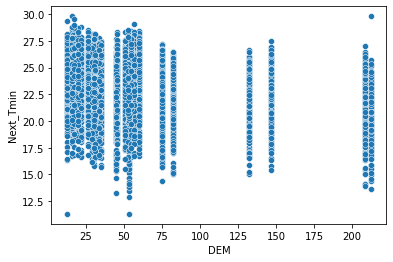

In [271]:
sns.scatterplot(x='DEM',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmin'>

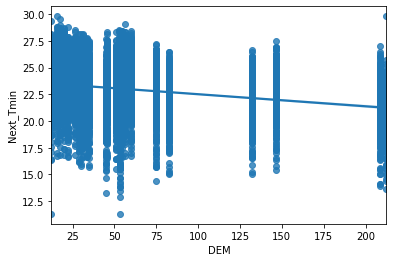

In [392]:
sns.regplot(x='DEM',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmin'>

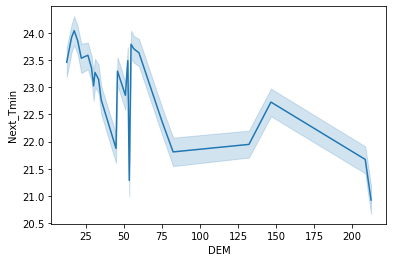

In [393]:
sns.lineplot(x='DEM',y='Next_Tmin',data=df)

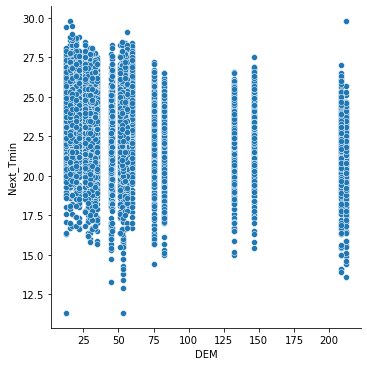

In [394]:
sns.relplot(x='DEM',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmin'>

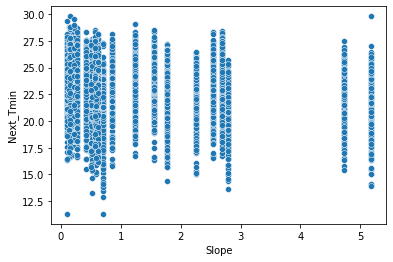

In [272]:
sns.scatterplot(x='Slope',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmin'>

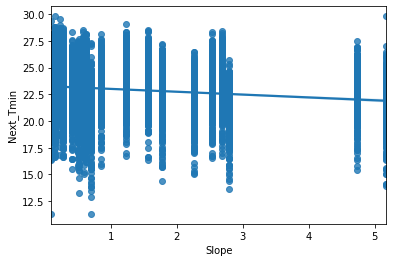

In [395]:
sns.regplot(x='Slope',y='Next_Tmin',data=df)

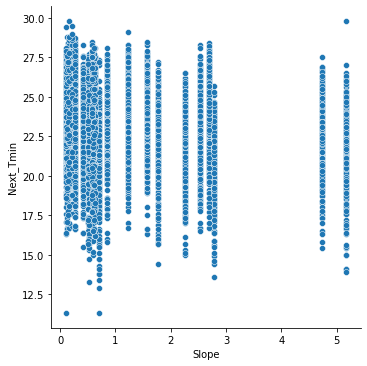

In [396]:
sns.relplot(x='Slope',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Slope', ylabel='Next_Tmin'>

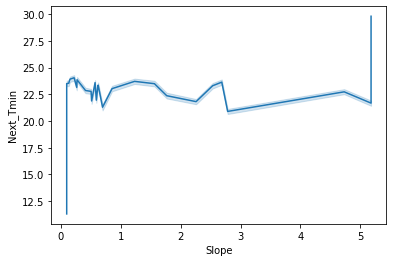

In [397]:
sns.lineplot(x='Slope',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmin'>

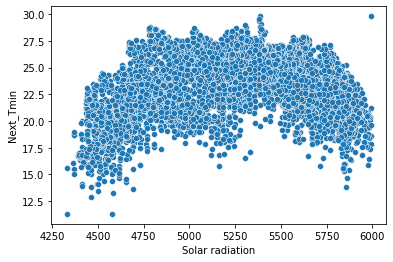

In [273]:
sns.scatterplot(x='Solar radiation',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmin'>

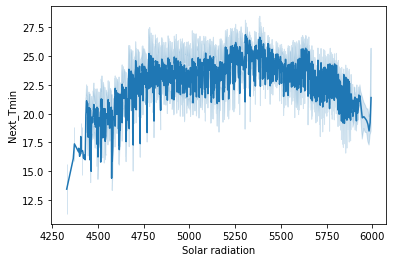

In [398]:
sns.lineplot(x='Solar radiation',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Solar radiation', ylabel='Next_Tmin'>

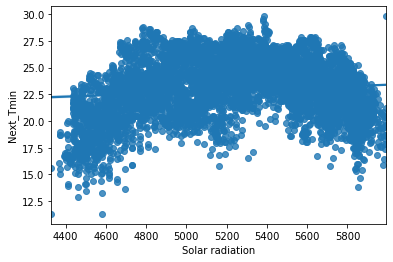

In [399]:
sns.regplot(x='Solar radiation',y='Next_Tmin',data=df)

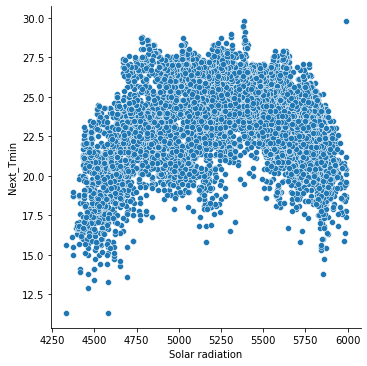

In [400]:
sns.relplot(x='Solar radiation',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Next_Tmax', ylabel='Next_Tmin'>

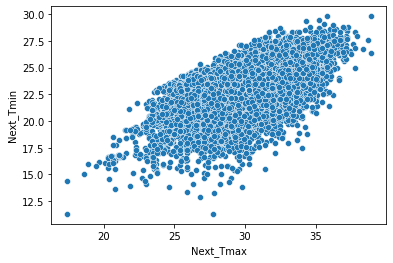

In [274]:
sns.scatterplot(x='Next_Tmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Next_Tmax', ylabel='Next_Tmin'>

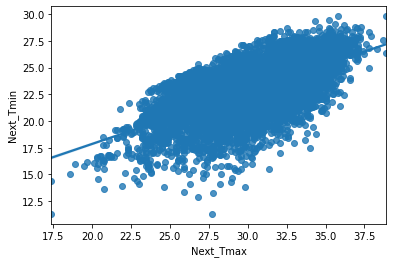

In [401]:
sns.regplot(x='Next_Tmax',y='Next_Tmin',data=df)

<AxesSubplot:xlabel='Next_Tmax', ylabel='Next_Tmin'>

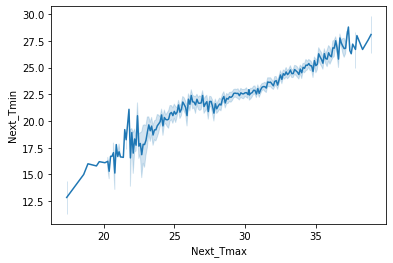

In [402]:
sns.lineplot(x='Next_Tmax',y='Next_Tmin',data=df)

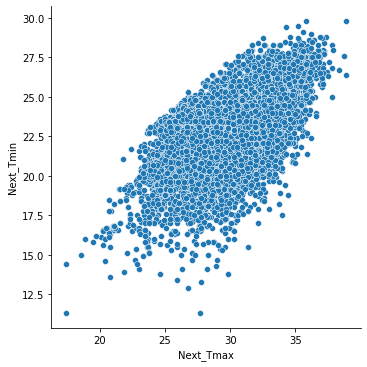

In [403]:
sns.relplot(x='Next_Tmax',y='Next_Tmin',data=df)

<AxesSubplot:>

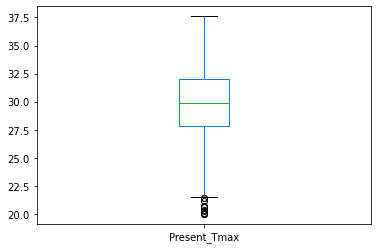

In [405]:
df["Present_Tmax"].plot.box()

<AxesSubplot:>

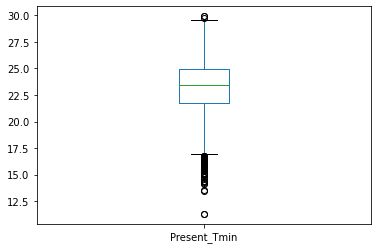

In [406]:
df["Present_Tmin"].plot.box()

<AxesSubplot:>

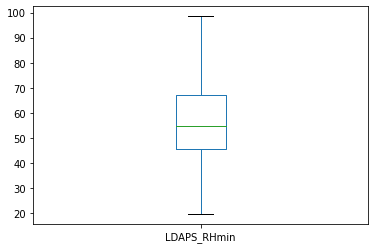

In [407]:
df["LDAPS_RHmin"].plot.box()

<AxesSubplot:>

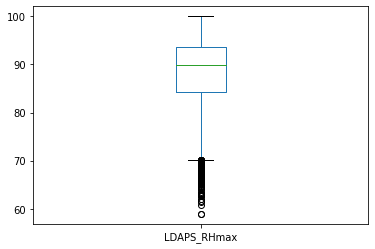

In [408]:
df["LDAPS_RHmax"].plot.box()

<AxesSubplot:>

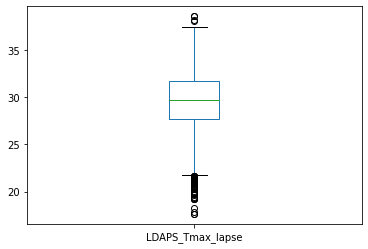

In [409]:
df["LDAPS_Tmax_lapse"].plot.box()

<AxesSubplot:>

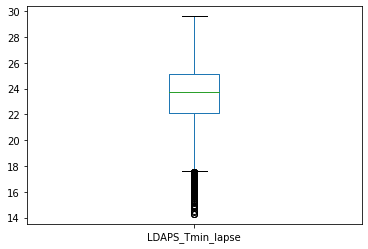

In [410]:
df["LDAPS_Tmin_lapse"].plot.box()

<AxesSubplot:>

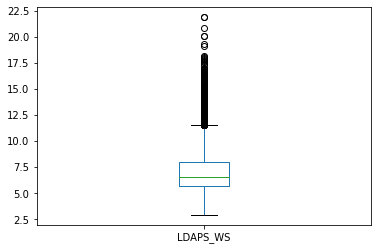

In [411]:
df["LDAPS_WS"].plot.box()

<AxesSubplot:>

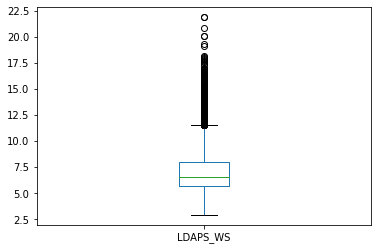

In [412]:
df["LDAPS_WS"].plot.box()

<AxesSubplot:>

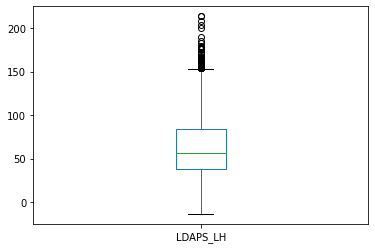

In [413]:
df["LDAPS_LH"].plot.box()

<AxesSubplot:>

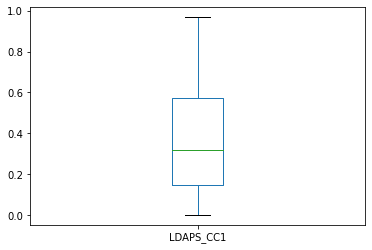

In [414]:
df["LDAPS_CC1"].plot.box()

<AxesSubplot:>

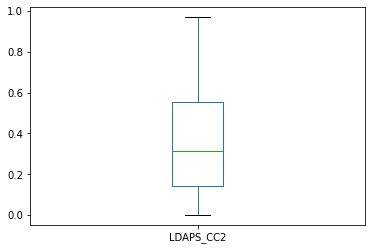

In [415]:
df["LDAPS_CC2"].plot.box()

<AxesSubplot:>

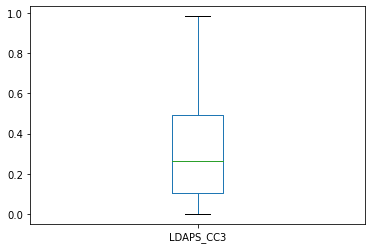

In [416]:
df["LDAPS_CC3"].plot.box()

<AxesSubplot:>

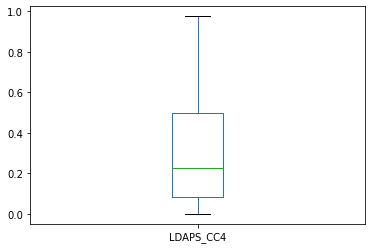

In [417]:
df["LDAPS_CC4"].plot.box()

<AxesSubplot:>

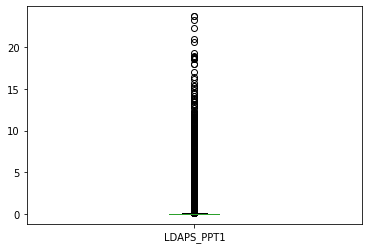

In [418]:
df["LDAPS_PPT1"].plot.box()

<AxesSubplot:>

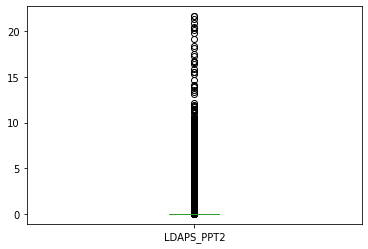

In [419]:
df["LDAPS_PPT2"].plot.box()

<AxesSubplot:>

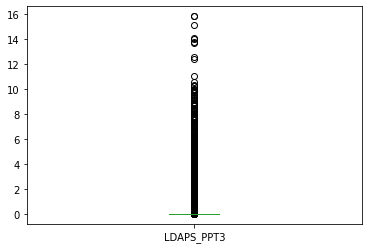

In [420]:
df["LDAPS_PPT3"].plot.box()

<AxesSubplot:>

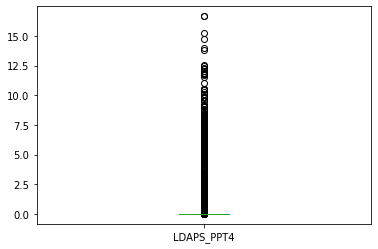

In [421]:
df["LDAPS_PPT4"].plot.box()

<AxesSubplot:>

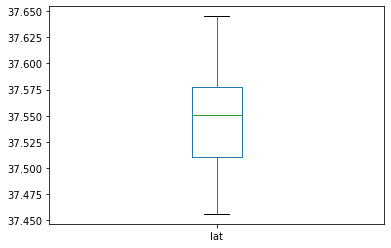

In [422]:
df["lat"].plot.box()

<AxesSubplot:>

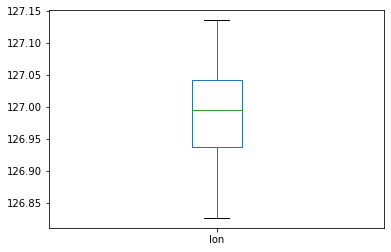

In [423]:
df["lon"].plot.box()

<AxesSubplot:>

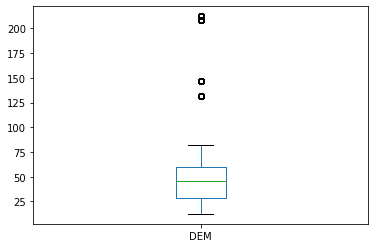

In [424]:
df["DEM"].plot.box()

<AxesSubplot:>

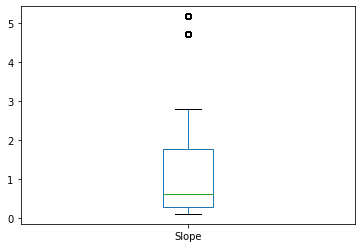

In [425]:
df["Slope"].plot.box()

<AxesSubplot:>

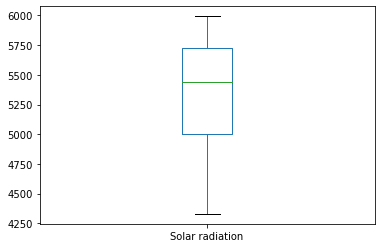

In [426]:
df["Solar radiation"].plot.box()

<AxesSubplot:>

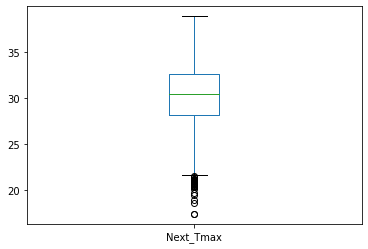

In [427]:
df["Next_Tmax"].plot.box()

<AxesSubplot:>

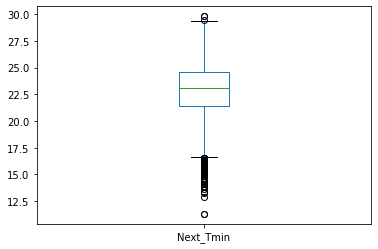

In [428]:
df["Next_Tmin"].plot.box()

In [430]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [433]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Date              7752 non-null   object 
 2   Present_Tmax      7752 non-null   float64
 3   Present_Tmin      7752 non-null   float64
 4   LDAPS_RHmin       7752 non-null   float64
 5   LDAPS_RHmax       7752 non-null   float64
 6   LDAPS_Tmax_lapse  7752 non-null   float64
 7   LDAPS_Tmin_lapse  7752 non-null   float64
 8   LDAPS_WS          7752 non-null   float64
 9   LDAPS_LH          7752 non-null   float64
 10  LDAPS_CC1         7752 non-null   float64
 11  LDAPS_CC2         7752 non-null   float64
 12  LDAPS_CC3         7752 non-null   float64
 13  LDAPS_CC4         7752 non-null   float64
 14  LDAPS_PPT1        7752 non-null   float64
 15  LDAPS_PPT2        7752 non-null   float64
 16  LDAPS_PPT3        7752 non-null   float64


In [434]:
from sklearn.preprocessing import OrdinalEncoder

In [435]:
enc = OrdinalEncoder()

In [436]:
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [437]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,290.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,290.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,290.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,290.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,290.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [429]:
from scipy.stats import zscore

In [438]:
z= np.abs(zscore(df))

In [439]:
df_new=df[(z<3).all(axis=1)]

In [440]:
df_new.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,290.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,290.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,290.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,290.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,290.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


<AxesSubplot:xlabel='Present_Tmax', ylabel='Density'>

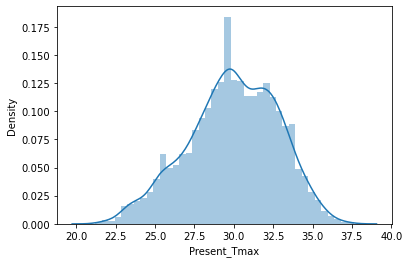

In [465]:
sns.distplot(df_new["Present_Tmax"])

<AxesSubplot:xlabel='Present_Tmin', ylabel='Density'>

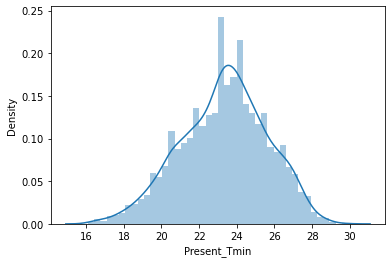

In [466]:
sns.distplot(df_new["Present_Tmin"])

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Density'>

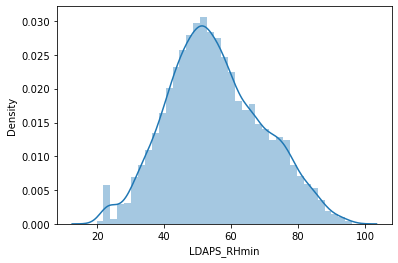

In [467]:
sns.distplot(df_new["LDAPS_RHmin"])

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Density'>

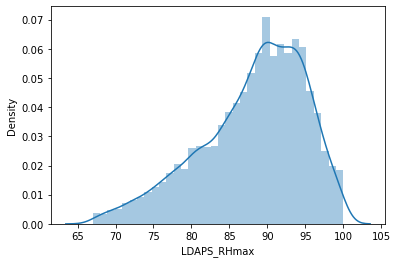

In [468]:
sns.distplot(df_new["LDAPS_RHmax"])

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Density'>

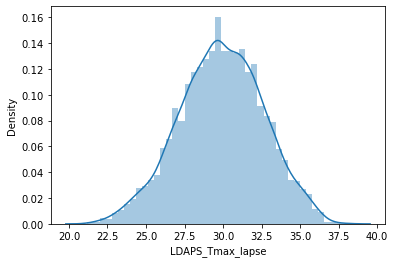

In [469]:
sns.distplot(df_new["LDAPS_Tmax_lapse"])

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Density'>

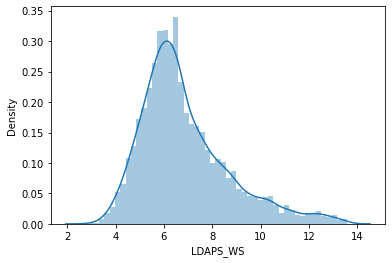

In [470]:
sns.distplot(df_new["LDAPS_WS"])

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Density'>

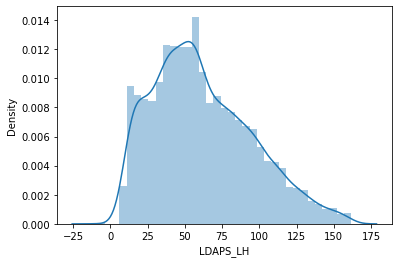

In [471]:
sns.distplot(df_new["LDAPS_LH"])

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Density'>

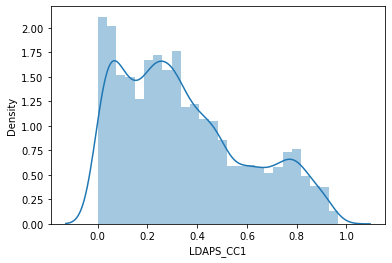

In [472]:
sns.distplot(df_new["LDAPS_CC1"])

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Density'>

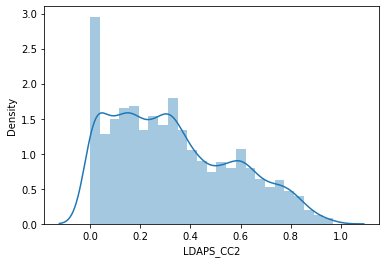

In [473]:
sns.distplot(df_new["LDAPS_CC2"])

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Density'>

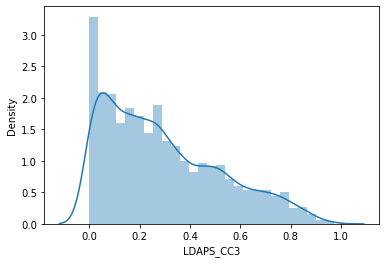

In [474]:
sns.distplot(df_new["LDAPS_CC3"])

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Density'>

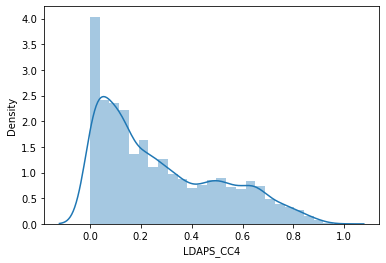

In [475]:
sns.distplot(df_new["LDAPS_CC4"])

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Density'>

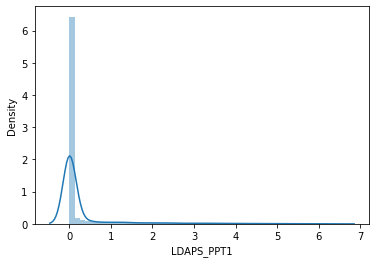

In [476]:
sns.distplot(df_new["LDAPS_PPT1"])

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Density'>

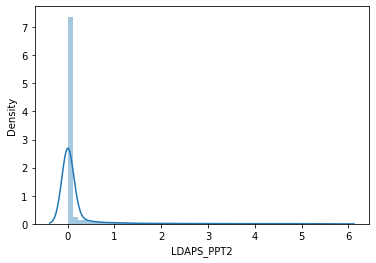

In [477]:
sns.distplot(df_new["LDAPS_PPT2"])

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Density'>

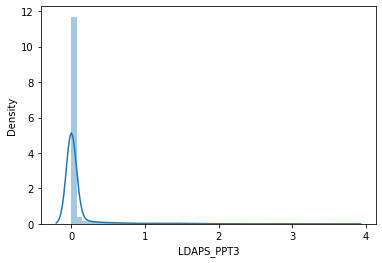

In [478]:
sns.distplot(df_new["LDAPS_PPT3"])

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Density'>

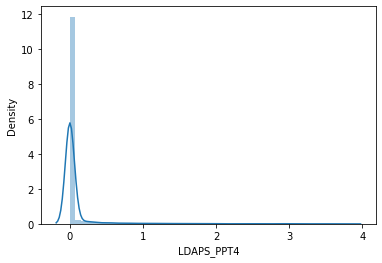

In [479]:
sns.distplot(df_new["LDAPS_PPT4"])

<AxesSubplot:xlabel='lat', ylabel='Density'>

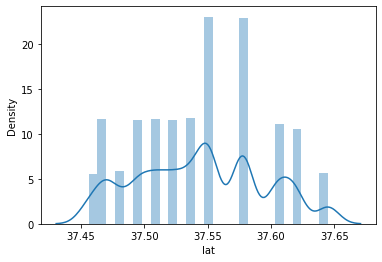

In [480]:
sns.distplot(df_new["lat"])

<AxesSubplot:xlabel='lon', ylabel='Density'>

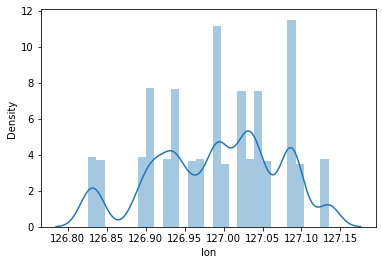

In [481]:
sns.distplot(df_new["lon"])

<AxesSubplot:xlabel='DEM', ylabel='Density'>

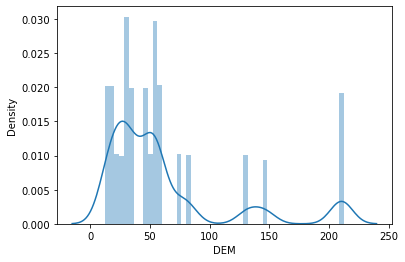

In [482]:
sns.distplot(df_new["DEM"])

In [460]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

<AxesSubplot:xlabel='Slope', ylabel='Density'>

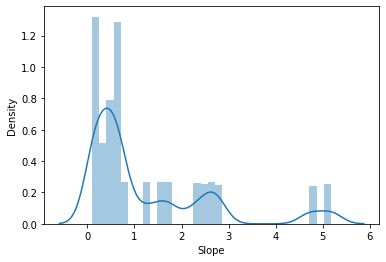

In [483]:
sns.distplot(df_new["Slope"])

<AxesSubplot:xlabel='Solar radiation', ylabel='Density'>

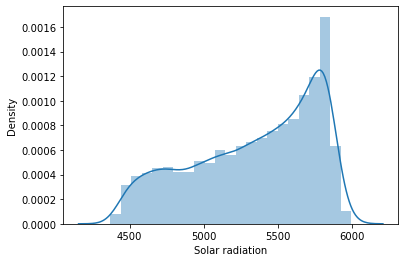

In [484]:
sns.distplot(df_new["Solar radiation"])

<AxesSubplot:xlabel='Next_Tmax', ylabel='Density'>

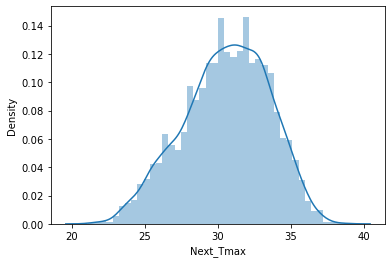

In [485]:
sns.distplot(df_new["Next_Tmax"])

<AxesSubplot:xlabel='Next_Tmin', ylabel='Density'>

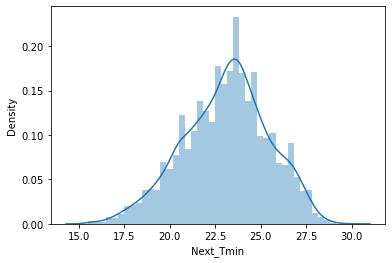

In [486]:
sns.distplot(df_new["Next_Tmin"])

In [487]:
from scipy.stats import skew

station
0.002790921677256593


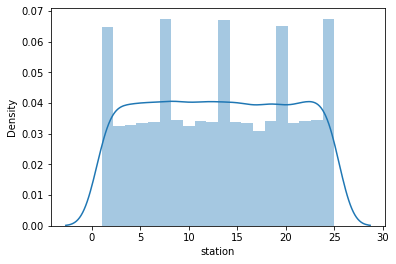

Date
0.008118391407499538


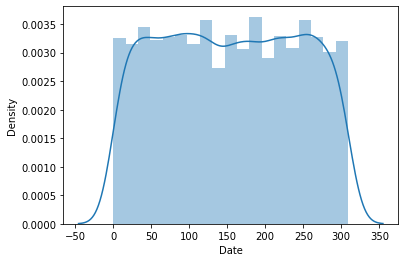

Present_Tmax
-0.27259382072384486


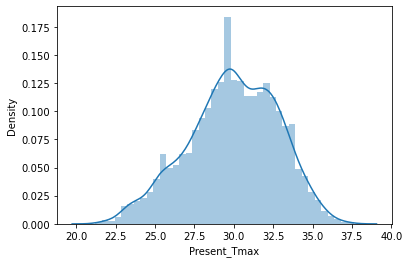

Present_Tmin
-0.22542948437920324


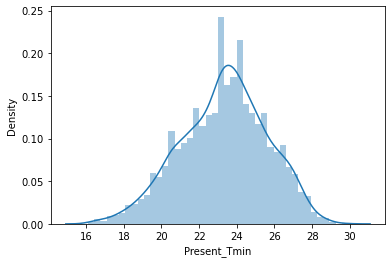

LDAPS_RHmin
0.22907180388146722


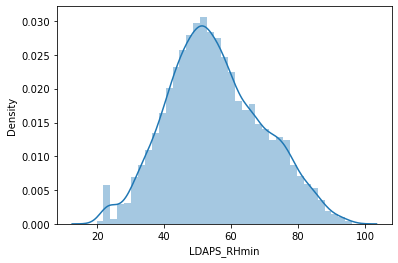

LDAPS_RHmax
-0.6939970352030007


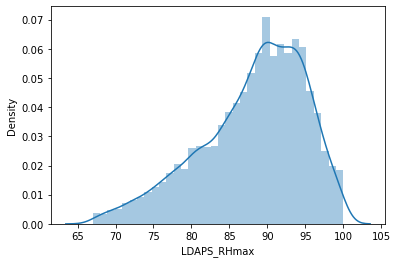

LDAPS_Tmax_lapse
-0.1093478627611255


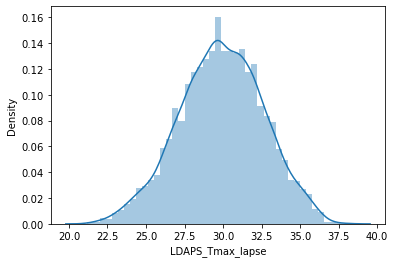

LDAPS_Tmin_lapse
-0.38623761223736075


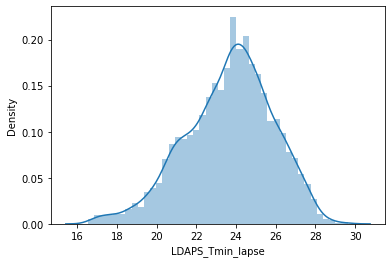

LDAPS_WS
1.0970127153697338


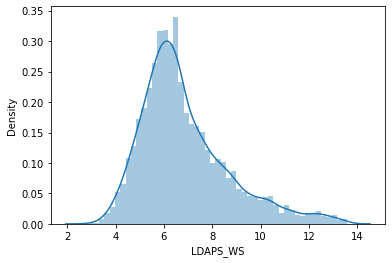

LDAPS_LH
0.5739414853662596


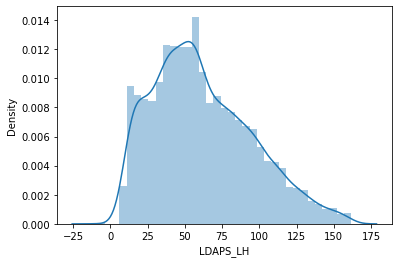

LDAPS_CC1
0.6006995651073767


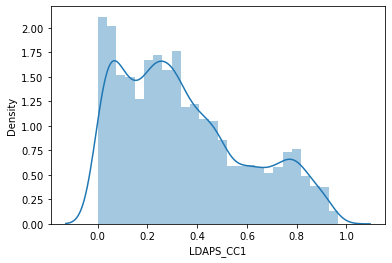

LDAPS_CC2
0.5067660874392852


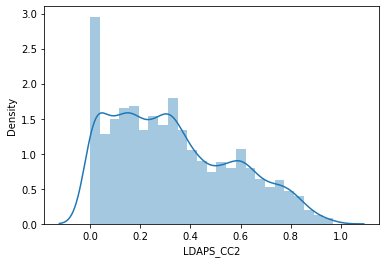

LDAPS_CC3
0.7078642002011364


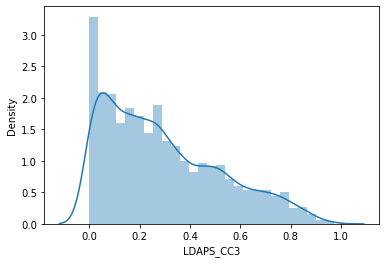

LDAPS_CC4
0.7202359134979773


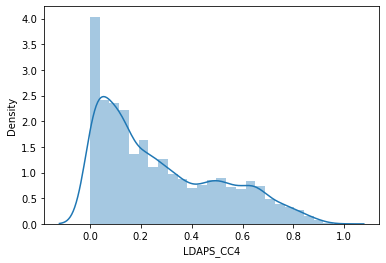

LDAPS_PPT1
3.74915939340829


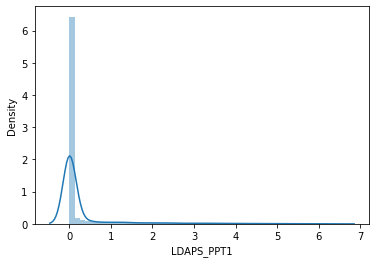

LDAPS_PPT2
4.868007987693979


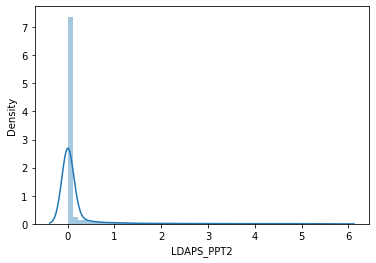

LDAPS_PPT3
5.51452180691722


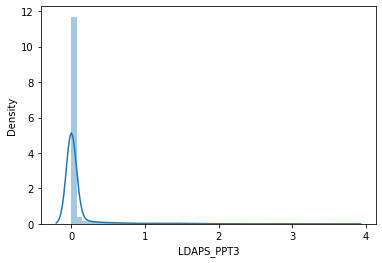

LDAPS_PPT4
5.9685767166360675


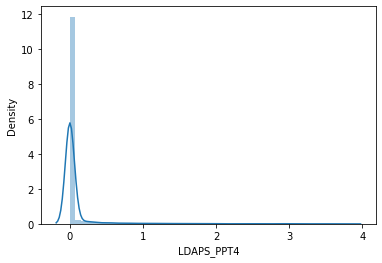

lat
0.10822763749526922


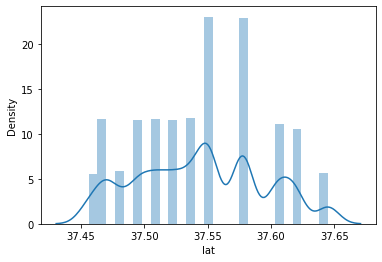

lon
-0.27544822876255837


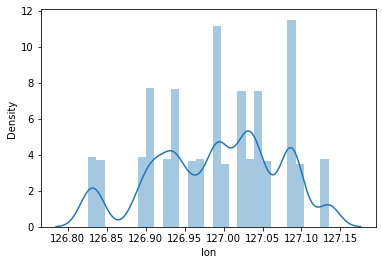

DEM
1.7636469282366898


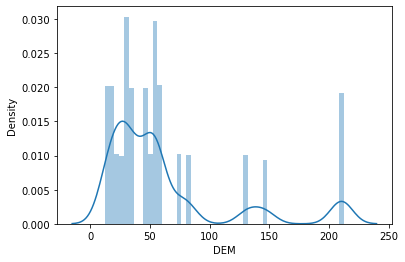

Slope
1.5932537375187992


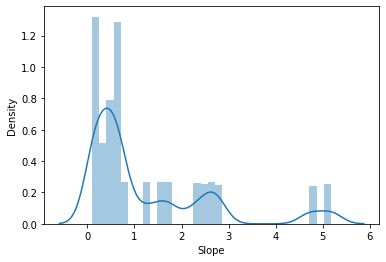

Solar radiation
-0.5052431054725751


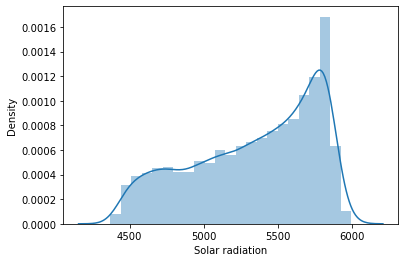

Next_Tmax
-0.2700249750908724


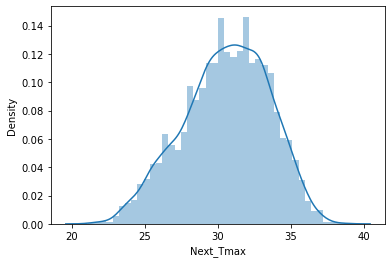

Next_Tmin
-0.23771550007434183


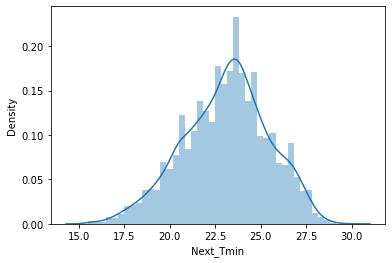

In [488]:
for i in df_new.columns:
    print(i)
    print(skew(df_new[i]))
    plt.figure()
    sns.distplot(df_new[i])
    plt.show()

In [489]:
from sklearn.preprocessing import PowerTransformer

In [490]:
df_new.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,290.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,290.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,290.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,290.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,290.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [491]:
a = df_new.iloc[:,:-2]

In [493]:
a.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,1.0,290.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996
1,2.0,290.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500
2,3.0,290.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664
3,4.0,290.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844
4,5.0,290.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246


In [494]:
pt=PowerTransformer(method='yeo-johnson') 
X_power=pt.fit_transform(a)
df=pd.DataFrame(X_power,columns=a.columns)

In [495]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.871049,1.397181,-0.480198,-0.847876,0.256669,0.344145,-0.673802,-0.359844,0.175819,0.350681,...,-0.516941,-0.523567,-0.483372,-0.460264,-0.4123,1.213337,-0.020409,1.854276,1.329510,1.889266
1,-1.658471,1.397181,0.668526,-0.765965,-0.162049,0.256207,-0.030722,0.109423,-0.579955,-0.169442,...,-0.537228,-0.523567,-0.483372,-0.460264,-0.4123,1.213337,0.502989,0.069427,-0.374447,1.434120
2,-1.464383,1.397181,0.555342,-0.045094,-0.420200,-0.729987,0.057585,0.363221,-0.255493,-1.387785,...,-0.447236,-0.523567,-0.483372,-0.460264,-0.4123,0.677101,0.841275,-0.353718,-0.943391,1.413770
3,-1.282978,1.397181,0.706507,-0.001324,0.255579,1.382311,-0.084189,-0.217272,-0.612334,0.245930,...,-0.496067,-0.523567,-0.483372,-0.460264,-0.4123,2.009404,0.374205,0.098490,1.250934,1.390562
4,-1.111079,1.397181,0.480519,-0.641952,0.113113,0.180422,-0.299338,-0.144616,-0.546962,1.305383,...,-0.281726,-0.523567,-0.483372,-0.460264,-0.4123,0.140865,1.872937,-0.279099,-0.390970,1.399661


In [496]:
df.skew()

station            -0.201793
Date               -0.274273
Present_Tmax       -0.031861
Present_Tmin       -0.021731
LDAPS_RHmin        -0.015375
LDAPS_RHmax        -0.100101
LDAPS_Tmax_lapse   -0.011202
LDAPS_Tmin_lapse   -0.025390
LDAPS_WS            0.005909
LDAPS_LH           -0.028195
LDAPS_CC1           0.063957
LDAPS_CC2           0.048225
LDAPS_CC3           0.092056
LDAPS_CC4           0.140749
LDAPS_PPT1          1.624705
LDAPS_PPT2          1.826222
LDAPS_PPT3          2.004598
LDAPS_PPT4          2.284110
lat                 0.091387
lon                -0.189409
DEM                 0.038729
Slope               0.233805
Solar radiation    -0.166145
dtype: float64

In [500]:
x= df

In [501]:
x

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-1.871049,1.397181,-0.480198,-0.847876,0.256669,0.344145,-0.673802,-0.359844,0.175819,0.350681,...,-0.516941,-0.523567,-0.483372,-0.460264,-0.4123,1.213337,-0.020409,1.854276,1.329510,1.889266
1,-1.658471,1.397181,0.668526,-0.765965,-0.162049,0.256207,-0.030722,0.109423,-0.579955,-0.169442,...,-0.537228,-0.523567,-0.483372,-0.460264,-0.4123,1.213337,0.502989,0.069427,-0.374447,1.434120
2,-1.464383,1.397181,0.555342,-0.045094,-0.420200,-0.729987,0.057585,0.363221,-0.255493,-1.387785,...,-0.447236,-0.523567,-0.483372,-0.460264,-0.4123,0.677101,0.841275,-0.353718,-0.943391,1.413770
3,-1.282978,1.397181,0.706507,-0.001324,0.255579,1.382311,-0.084189,-0.217272,-0.612334,0.245930,...,-0.496067,-0.523567,-0.483372,-0.460264,-0.4123,2.009404,0.374205,0.098490,1.250934,1.390562
4,-1.111079,1.397181,0.480519,-0.641952,0.113113,0.180422,-0.299338,-0.144616,-0.546962,1.305383,...,-0.281726,-0.523567,-0.483372,-0.460264,-0.4123,0.140865,1.872937,-0.279099,-0.390970,1.399661
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6889,1.076181,1.519191,-2.182360,-2.216543,-2.388933,-1.379130,-0.767070,-2.145213,0.046561,-2.025346,...,-1.463178,-0.523567,-0.483372,-0.460264,-0.4123,0.140865,0.606546,-0.713196,-0.267842,-1.769822
6890,1.194125,1.519191,-2.341738,-2.356118,-1.899504,-0.766268,-1.158395,-2.298311,-0.521900,0.688673,...,-1.347889,-0.523567,-0.483372,-0.460264,-0.4123,-0.672366,1.211215,-0.999837,-1.353505,-1.787788
6891,1.310706,1.519191,-2.128251,-2.459140,-2.198924,-1.317743,-1.281677,-1.991604,-0.248158,0.422375,...,-1.502104,-0.523567,-0.483372,-0.460264,-0.4123,-0.129620,-1.246972,-1.576839,-1.278278,-1.785890
6892,1.425997,1.519191,-2.128251,-2.251674,-2.450142,-1.473102,-1.051193,-2.005531,0.009167,-0.322838,...,-1.502104,-0.523567,-0.483372,-0.460264,-0.4123,-0.400697,-1.031307,-1.397766,-1.068473,-1.792090


In [505]:
y = df_new.loc[:,"Next_Tmax":"Next_Tmin"]

In [506]:
y

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5
...,...,...
7745,27.6,17.7
7746,28.0,17.1
7747,28.3,18.1
7748,28.6,18.8


In [507]:
from sklearn.model_selection import train_test_split

In [508]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.20,random_state=40)

In [509]:
x_train.shape

(5515, 23)

In [510]:
x_test.shape

(1379, 23)

In [511]:
y_train.shape

(5515, 2)

In [512]:
y_test.shape

(1379, 2)

In [513]:
from sklearn.model_selection import GridSearchCV

In [514]:
from sklearn.model_selection import cross_val_score

In [515]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score
import numpy as np

In [516]:
lr = LinearRegression()
lr.fit(x_train,y_train)
lr.score(x_train,y_train)
predlr=lr.predict(x_test)
print(r2_score(y_test,predlr))

0.7838489215674546


In [517]:
lr.score(x_train,y_train)

0.7789986967197571

In [518]:
parameter_lr = {'copy_X':['true','false'],'fit_intercept':['true','false'],'n_jobs':np.arange(1,5)}
gc = GridSearchCV(LinearRegression(),parameter_lr,cv = 5)
gc.fit(x,y)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'copy_X': ['true', 'false'],
                         'fit_intercept': ['true', 'false'],
                         'n_jobs': array([1, 2, 3, 4])})

In [519]:
gc.best_params_

{'copy_X': 'true', 'fit_intercept': 'true', 'n_jobs': 1}

In [520]:
LR = LinearRegression(copy_X='true',fit_intercept='true',n_jobs='1')

In [521]:
LR.fit(x_train,y_train)
LR.score(x_train,y_train)

0.7789986967197571

In [522]:
print(cross_val_score(LR,x,y,cv=5).mean())

0.711220207155952


In [523]:
from sklearn.ensemble import RandomForestRegressor

In [524]:
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
rf.score(x_train,y_train)
predrf = rf.predict(x_test)
print(r2_score(y_test,predrf))

0.8915923212399364


In [525]:
rf.score(x_train,y_train)

0.9839997014154851

In [538]:
rf.score(x_test,y_test)

0.8915923212399364

In [526]:
parameter_rf= {'n_estimators':np.arange(1,10),'max_features':['auto','sqrt','log2'],
                 'criterion': ['squared_error','absolute_error','poisson']}

In [527]:
gc = GridSearchCV(RandomForestRegressor(),parameter_rf,cv = 5)
gc.fit(x,y)
gc.best_params_

{'criterion': 'poisson', 'max_features': 'auto', 'n_estimators': 8}

In [528]:
RF=RandomForestRegressor(criterion='poisson',max_features='auto',n_estimators=8)

In [529]:
RF.fit(x_train,y_train)
RF.score(x_train,y_train)

0.9418955433566114

In [530]:
print(cross_val_score(RF,x,y,cv=3).mean())

0.4779286430184743


In [534]:
from sklearn.tree import DecisionTreeRegressor

In [535]:
dc = DecisionTreeRegressor()
dc.fit(x_train,y_train)
dc.score(x_train,y_train)
preddc = dc.predict(x_test)
print(r2_score(y_test,preddc))

0.7446364373163384


In [536]:
dc.score(x_train,y_train)

1.0

In [537]:
dc.score(x_test,y_test)

0.7446364373163384

In [539]:
paramdc={'criterion':['squared_error','friedman_mse','poisson'],
          'splitter':['best','random'],
           'max_depth':np.arange(1,10)}

In [540]:
gc = GridSearchCV(DecisionTreeRegressor(),paramdc,cv=5)
gc.fit(x,y)
gc.best_params_

{'criterion': 'friedman_mse', 'max_depth': 6, 'splitter': 'best'}

In [541]:
Dc = DecisionTreeRegressor(criterion='friedman_mse',max_depth=6,splitter= 'best')

In [542]:
Dc.fit(x_train,y_train)
Dc.score(x_train,y_train)

0.7456454192301258

In [543]:
Dc.score(x_test,y_test)

0.7186323526449974

In [546]:
print(cross_val_score(Dc,x,y,cv=5).mean())

0.5795947385129404


In [547]:
import pickle

In [ ]:
filename ='temp.pkl'
pickle.dump(LR,open(filename,'wb'))